<a href="https://colab.research.google.com/github/MerAlDa99/Resources/blob/main/Mercedes_Dalman_ddls_2024_module_3_computer_lab_scRNASeq.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# scRNASeq Data Analysis Workflow

Task:

You will explore the expression profiles of patients with significant lung inflammation, focusing on differences between elderly patients and healthy controls at the single-cell level using scRNASeq data. Your goal is to identify key differences in gene expression between the two groups.

### Data Description:

- **Samples:** 4 patients with lung inflammation and 4 healthy controls.
- **Data Size:** Each sample has been subsampled to include 1500 cells.


**NOTE:**  
- Each step has some information about the analysis.  
- We save the data afte reach step, but if running the entire workflow at once, you may not need to save after every step.   



  
## Workflow Steps:

In this notebook, you will perform a standard scRNASeq data analysis using the following steps:

1\. **Loading the Data:**

   - Import raw scRNASeq data into the environment for further processing and analysis.

2\. **Quality Control:**

   - Evaluate the data quality by filtering out low-quality cells, such as those with high mitochondrial content or low gene counts.

3\. **Filtering:**

   - Remove cells and genes that do not meet quality thresholds, ensuring the analysis uses only relevant data.

4\. **Doublet Detection:**

   - Identify and exclude potential doublets (instances where two cells are mistakenly captured as one), which can skew the results.

5\. **Cell Cycle Regression:**

   - Correct for cell cycle effects to reduce their influence on subsequent analyses, leading to more accurate clustering of cells.

6\. **Feature Selection:**

   - Identify highly variable genes that are most informative for distinguishing different cell states or types.

7\. **Data Integration (Batch Correction):**

   - Merge data from multiple samples, correcting for technical variations between them to allow accurate comparison.

8\. **Dimensionality Reduction:**

   - Simplify the data using methods like PCA or UMAP to reveal patterns and make the data easier to visualize and interpret.

9\. **Differential Expression:**

   - Identify genes that are differentially expressed between cell populations, which helps define distinct cell types or states.

This workflow will guide you through analyzing scRNASeq data, helping you identify critical expression differences between patient and healthy control samples.

_These materials are primarily derived from the scRNASeq workshop created at NBIS (Åsa Björklund, Paulo Czarnewski, Susanne Reinsbach, Roy Francis). To access the full course content, please visit [here](https://nbisweden.github.io/workshop-scRNAseq/)._  


## 📚 Preparation Task: Understanding Basic Concepts in scRNASeq Data Analysis

Before diving into the scRNASeq data analysis workflow, it's essential to have a good grasp of the key concepts and steps involved in analyzing single-cell RNA sequencing (scRNASeq) data. This understanding will help you follow along more effectively during the lab activities and get the most out of the practical session.

#### Key Concepts to Understand:

1\. **scRNASeq**: What is single-cell RNA sequencing, and how does it differ from bulk RNA sequencing? Why is scRNASeq useful for studying gene expression at the single-cell level?

2\. **Quality Control in scRNASeq**: What are the common quality metrics used to assess scRNASeq data, and why is quality control important? How do metrics like mitochondrial gene content and gene count per cell affect data quality?

3\. **Doublet Detection**: What are doublets in scRNASeq data, and how do they impact the analysis? What methods are commonly used to detect and remove doublets?

4\. **Batch Correction and Data Integration**: Why is batch correction necessary in scRNASeq data analysis? What are the challenges of integrating data from multiple samples, and how can they be addressed?

5\. **Dimensionality Reduction Techniques**: What are PCA and UMAP, and why are they used in scRNASeq data analysis? How do these techniques help in visualizing and interpreting high-dimensional data?

6\. **Differential Expression Analysis**: What is differential expression analysis, and how is it used to compare gene expression between different groups? What are the key steps in performing differential expression analysis in scRNASeq?

7\. **Cell Cycle Effects and Regression**: How do cell cycle stages influence scRNASeq data, and why is it important to correct for these effects? What approaches are used to account for cell cycle variability?

8\. **Feature Selection in scRNASeq**: What is feature selection, and why is it critical for identifying highly variable genes in scRNASeq data? How does feature selection impact downstream analyses?

9\. **Gene Expression Profiles in Disease Contexts**: How can scRNASeq data be used to explore gene expression differences in disease versus healthy states? What are some of the challenges and considerations in interpreting these differences?

10\. **Application of scRNASeq in Disease Research**: How has scRNASeq been applied in studying diseases such as inflammation and cancer? What insights have been gained from these applications, and what are the limitations?

**Note**: Some students may not have prior experience with bioinformatics or scRNASeq, so it's important to review these concepts thoroughly or seek additional resources if necessary.

#### Pre-Task: Create a ChatGPT Prompt to Enhance Your Understanding

To deepen your understanding of these concepts, we encourage you to construct a well-structured prompt to ask ChatGPT about any of the concepts you're unfamiliar with. A good prompt will help you get a more precise and useful response from the AI.

**Instructions for Crafting Your Prompt:**

1\. **Task**: Start your prompt with a clear task specifying what you want to learn. For example, "Explain the importance of quality control in scRNASeq data analysis and the common metrics used."

2\. **Context**: Provide background information or specify why you need this knowledge. For example, "I am preparing for a computer lab on scRNASeq data analysis and need to understand how quality control affects the data interpretation."

3\. **Exemplars**: If possible, give examples to guide the AI in providing the type of information you're looking for. For example, "Can you also provide an example of how mitochondrial gene content is used as a quality metric?"

4\. **Persona**: Specify who you want the AI to be. For example, "Act as an experienced bioinformatician with expertise in single-cell RNA sequencing."

5\. **Format**: Specify how you want the information to be presented. For example, "Please provide a concise explanation followed by a practical example."

6\. **Tone**: Indicate the tone of the response. For example, "Explain it in a clear and straightforward manner suitable for a beginner in bioinformatics."

**Example Prompt:**

"Explain the role of dimensionality reduction techniques like PCA and UMAP in scRNASeq data analysis. I am preparing for a computer lab focused on identifying gene expression differences in patients with lung inflammation compared to healthy controls. Act as an experienced bioinformatician, and provide a brief explanation followed by an example of how these techniques help visualize high-dimensional data."

**Steps:**

1\. Review the list of concepts.

2\. Identify any concepts you're not familiar with.

3\. Construct a ChatGPT prompt using the guidelines above.

4\. Ask ChatGPT your prompt and take notes on the response.

### 🌞 Upload your ChatGPT conversation history

After finishing this task, you paste the chat history below. If you're unable to generate a shareable link with ChatGPT, or you used **other large language model product**, you can upload in the [Submission Google Forms](https://forms.gle/mRPab1v3uE52QsDX9).

(If you are confident enough about this, feel free to skip this step)


```
#⭐ Double click to upload your chat history here
#link: https://...
```

In [2]:
#@title Install dependencies
#@markdown You can run the notebook using CPU.
#@markdown In the menu above do: Runtime --> Change runtime type --> Hardware accelerator (set to CPU)

#@markdown **Press play to install**.

#@markdown (Note: You do NOT need to restart the runtime afterwards.)

!pip install --upgrade pip
!pip install jedi
!pip install numpydoc
!pip install bbknn
!pip install geopandas
!pip install harmonypy
!pip install leidenalg
!pip install matplotlib-scalebar
!pip install matplotlib-venn
!pip install napari-matplotlib
!pip install pybiomart
!pip install scanpy
!pip install scrublet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 28.8 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 28.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 647.5/647.5 kB 23.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for annoy: filename=annoy-1.17.3-cp311-cp311-linux_x86_64.whl size=551662 sha256=eb5d334e84b57bc2df47f527f7d80924efca998b9ea2860e2ce654514992c290
  Stored in directory: /root/.cache/pip/wheels/33/e5/58/0a3e34b92bedf09b4c57e37a63ff395ade6f6c1099ba59877c
Successfully built annoy
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 56.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 113.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 66.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 765.5/765

### Importing packages

We will first import all packages we will use in this notebook.


In [3]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# single cell analysis
import scanpy as sc
import scanpy.external as sce

# Plotting
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib_venn import venn3

# Integration
import harmonypy as hm
import bbknn

# Clustering
import leidenalg # Leiden clustering
from sklearn.cluster import KMeans # KMeans clustering
from sklearn.metrics import adjusted_rand_score  # ARI
from sklearn.cluster import AgglomerativeClustering # Agglomerative clustering


import pybiomart # for gene annotation
import warnings
import os # for file handling

import urllib.request

warnings.simplefilter(action='ignore', category=Warning)

We then set the Matplotlib plotting defaults for all plots and print versions of python packages in the current environment.  

In [ ]:
sc.settings.set_figure_params(dpi = 90, facecolor='white')
# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.verbosity = 3
sc.logging.print_header()

scanpy==1.10.2 anndata==0.10.9 umap==0.5.6 numpy==1.26.4 scipy==1.13.1 pandas==2.1.4 scikit-learn==1.3.2 statsmodels==0.14.2 igraph==0.11.6 pynndescent==0.5.13


## Loading the Data

In this computer lab, we will use 8 PBMC (Peripheral Blood Mononuclear Cells) datasets from four COVID-19 patients and four healthy controls, generated using 10x Genomics technology. To make the analysis more manageable, each dataset has been subsampled to 1500 cells per sample.

In [ ]:
#@title Download pre-computed annotation

import os
import urllib.request

#@markdown **url_data**: URL to download the PBMC datasets from
url_data = "https://export.uppmax.uu.se/naiss2023-23-3/workshops/workshop-scrnaseq/" #@param {type:"string"}

#@markdown **path_data**: Path to store the datasets
path_data = "/content/data/covid/"  #@param {type:"string"}
if not os.path.exists(path_data):
    os.makedirs(path_data, exist_ok=True)

#@markdown **path_results**: Output directory to store analysis results
path_results = "/content/data/covid/results/"  #@param {type:"string"}
if not os.path.exists(path_results):
    os.makedirs(path_results, exist_ok=True)

#@markdown We will download the following files:

#@markdown **Normal samples:**
#@markdown - normal_pbmc_5.h5
#@markdown - normal_pbmc_13.h5
#@markdown - normal_pbmc_14.h5
#@markdown - normal_pbmc_19.h5


#@markdown **COVID-19 samples:**
#@markdown - ncov_pbmc_1.h5
#@markdown - ncov_pbmc_15.h5
#@markdown - ncov_pbmc_16.h5
#@markdown - ncov_pbmc_17.h5


In [ ]:
import os
import urllib.request

url_data = "https://export.uppmax.uu.se/naiss2023-23-3/workshops/workshop-scrnaseq/covid/"

files_to_download = [
    "normal_pbmc_5.h5",
    "normal_pbmc_13.h5",
    "normal_pbmc_14.h5",
    "normal_pbmc_19.h5",
    "ncov_pbmc_1.h5",
    "ncov_pbmc_15.h5",
    "ncov_pbmc_16.h5",
    "ncov_pbmc_17.h5"
]
for file in files_to_download:
  fetch_path = os.path.join(url_data, file)
  data_save = os.path.join(path_data, file)

  print(os.path.join(url_data, file))
  urllib.request.urlretrieve(fetch_path, data_save)


https://export.uppmax.uu.se/naiss2023-23-3/workshops/workshop-scrnaseq/covid/normal_pbmc_5.h5
https://export.uppmax.uu.se/naiss2023-23-3/workshops/workshop-scrnaseq/covid/normal_pbmc_13.h5
https://export.uppmax.uu.se/naiss2023-23-3/workshops/workshop-scrnaseq/covid/normal_pbmc_14.h5
https://export.uppmax.uu.se/naiss2023-23-3/workshops/workshop-scrnaseq/covid/normal_pbmc_19.h5
https://export.uppmax.uu.se/naiss2023-23-3/workshops/workshop-scrnaseq/covid/ncov_pbmc_1.h5
https://export.uppmax.uu.se/naiss2023-23-3/workshops/workshop-scrnaseq/covid/ncov_pbmc_15.h5
https://export.uppmax.uu.se/naiss2023-23-3/workshops/workshop-scrnaseq/covid/ncov_pbmc_16.h5
https://export.uppmax.uu.se/naiss2023-23-3/workshops/workshop-scrnaseq/covid/ncov_pbmc_17.h5


Now, write your code to download the eight files to the `path_data` directory.

You can download each file from the `os.path.join(url_data, "covid")` directory by using the following function:

```python
urllib.request.urlretrieve(remote_file_url, local_file_path)
```

Once you have completed the downloads, you can verify the files using:
```
!ls /content/data/covid
```

In [ ]:
!ls /content/data/covid

covid_data.zip	 ncov_pbmc_16.h5  ncov_pbmc_1.h5     normal_pbmc_14.h5	normal_pbmc_5.h5
ncov_pbmc_15.h5  ncov_pbmc_17.h5  normal_pbmc_13.h5  normal_pbmc_19.h5	results


Let's load the data by `read_10x_h5`.  

In [ ]:
data_cov1 = sc.read_10x_h5(os.path.join(path_data,'ncov_pbmc_1.h5'))
data_cov1.var_names_make_unique()
data_cov15 = sc.read_10x_h5(os.path.join(path_data,'ncov_pbmc_15.h5'))
data_cov15.var_names_make_unique()
data_cov16 = sc.read_10x_h5(os.path.join(path_data,'ncov_pbmc_16.h5'))
data_cov16.var_names_make_unique()
data_cov17 = sc.read_10x_h5(os.path.join(path_data,'ncov_pbmc_17.h5'))
data_cov17.var_names_make_unique()
data_ctrl5 = sc.read_10x_h5(os.path.join(path_data,'normal_pbmc_5.h5'))
data_ctrl5.var_names_make_unique()
data_ctrl13 = sc.read_10x_h5(os.path.join(path_data,'normal_pbmc_13.h5'))
data_ctrl13.var_names_make_unique()
data_ctrl14 = sc.read_10x_h5(os.path.join(path_data,'normal_pbmc_14.h5'))
data_ctrl14.var_names_make_unique()
data_ctrl19 = sc.read_10x_h5(os.path.join(path_data,'normal_pbmc_19.h5'))
data_ctrl19.var_names_make_unique()

reading /content/data/covid/ncov_pbmc_1.h5
 (0:00:00)
reading /content/data/covid/ncov_pbmc_15.h5
 (0:00:00)
reading /content/data/covid/ncov_pbmc_16.h5
 (0:00:00)
reading /content/data/covid/ncov_pbmc_17.h5
 (0:00:00)
reading /content/data/covid/normal_pbmc_5.h5
 (0:00:00)
reading /content/data/covid/normal_pbmc_13.h5
 (0:00:00)
reading /content/data/covid/normal_pbmc_14.h5
 (0:00:00)
reading /content/data/covid/normal_pbmc_19.h5
 (0:00:00)


Let's add some metadata.  

In [ ]:
# add some metadata
data_cov1.obs['type']="Covid"
data_cov1.obs['sample']="covid_1"
data_cov15.obs['type']="Covid"
data_cov15.obs['sample']="covid_15"
data_cov16.obs['type']="Covid"
data_cov16.obs['sample']="covid_16"
data_cov17.obs['type']="Covid"
data_cov17.obs['sample']="covid_17"
data_ctrl5.obs['type']="Ctrl"
data_ctrl5.obs['sample']="ctrl_5"
data_ctrl13.obs['type']="Ctrl"
data_ctrl13.obs['sample']="ctrl_13"
data_ctrl14.obs['type']="Ctrl"
data_ctrl14.obs['sample']="ctrl_14"
data_ctrl19.obs['type']="Ctrl"
data_ctrl19.obs['sample']="ctrl_19"

We can now merge all the anndata to a single anndata object and remove the individual anndata objects:

In [ ]:
# merge into one object.
adata = data_cov1.concatenate(data_cov15, data_cov16, data_cov17, data_ctrl5, data_ctrl13, data_ctrl14, data_ctrl19)

# and delete individual datasets to save space
del(data_cov1, data_cov15, data_cov16, data_cov17)
del(data_ctrl5, data_ctrl13, data_ctrl14, data_ctrl19)

In [ ]:
adata

AnnData object with n_obs × n_vars = 12000 × 33538
    obs: 'type', 'sample', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'

**How many cells and genes are in this dataset?**

**ANSWER:** 12000 cells and 33538 genes.

Checking the `var` slot which contains gene annotation information.  

In [ ]:
adata.var

,gene_ids,feature_types,genome
MIR1302-2HG,ENSG00000243485,Gene Expression,GRCh38
FAM138A,ENSG00000237613,Gene Expression,GRCh38
OR4F5,ENSG00000186092,Gene Expression,GRCh38
AL627309.1,ENSG00000238009,Gene Expression,GRCh38
AL627309.3,ENSG00000239945,Gene Expression,GRCh38
...,...,...,...
AC233755.2,ENSG00000277856,Gene Expression,GRCh38
AC233755.1,ENSG00000275063,Gene Expression,GRCh38
AC240274.1,ENSG00000271254,Gene Expression,GRCh38
AC213203.1,ENSG00000277475,Gene Expression,GRCh38


## Quality Control (QC)
Here we can check generate some metrics which helps us to evaluate the quality of the dataset:
- `total_counts`:  Total number of molecules in a cell.  
- `n_genes_by_counts`: Number of genes with at least one count in a cell.  
- `pct_counts_mt`: The percentage of reads mapped to mitochondrial genes.  
- `pct_counts_ribo`: The percentage of reads mapped to ribosomal genes.  
- `pct_counts_hb`: The percentage of reads mapped to hemoglobin genes (blood cells).  

In [ ]:
# mitochondrial genes
adata.var['mt'] = adata.var_names.str.startswith('MT-')
# ribosomal genes
adata.var['ribo'] = adata.var_names.str.startswith(("RPS","RPL"))
# hemoglobin genes.
adata.var['hb'] = adata.var_names.str.contains(("^HB[^(P|E|S)]"))

adata.var

,gene_ids,feature_types,genome,mt,ribo,hb
MIR1302-2HG,ENSG00000243485,Gene Expression,GRCh38,False,False,False
FAM138A,ENSG00000237613,Gene Expression,GRCh38,False,False,False
OR4F5,ENSG00000186092,Gene Expression,GRCh38,False,False,False
AL627309.1,ENSG00000238009,Gene Expression,GRCh38,False,False,False
AL627309.3,ENSG00000239945,Gene Expression,GRCh38,False,False,False
...,...,...,...,...,...,...
AC233755.2,ENSG00000277856,Gene Expression,GRCh38,False,False,False
AC233755.1,ENSG00000275063,Gene Expression,GRCh38,False,False,False
AC240274.1,ENSG00000271254,Gene Expression,GRCh38,False,False,False
AC213203.1,ENSG00000277475,Gene Expression,GRCh38,False,False,False


Now we calculate some QC metrics, such as percentage of mitochondrial genes.

In [ ]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo','hb'], percent_top=None, log1p=False, inplace=True)
adata

AnnData object with n_obs × n_vars = 12000 × 33538
    obs: 'type', 'sample', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

Now we plot the QC metrics.  

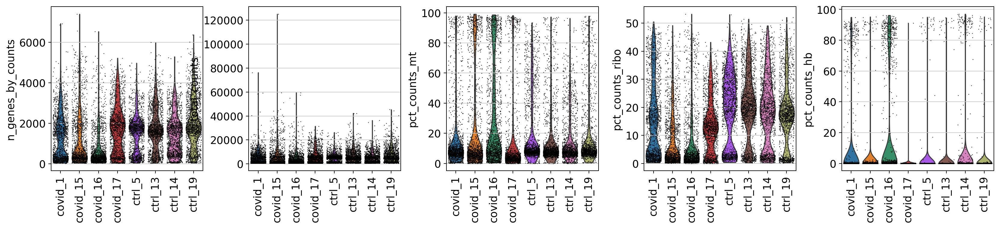

In [ ]:
sc.pl.violin(adata,
             ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, groupby = 'sample', rotation= 90,
             multi_panel=False)

**Samples `covid_15` & `covid_16` show distinct behaviour: fewer detected genes and more mitochondrial genes. Please explain what could cause this.**

**ANSWER:** Higher pct_mito can be because of stressed or damaged cells. Also lower detected genes can be because of bad sample quality - low rna content (e.g. degradation) or (as pct_mito indicates) bad cell health in general. Can be both technical issues (library prep went bad, rt, lysis etc.) or just biological (disease related?).

 In addition to above metrics we can plot `total_counts` vs ` n_genes_by_count` in a scatterplot.  

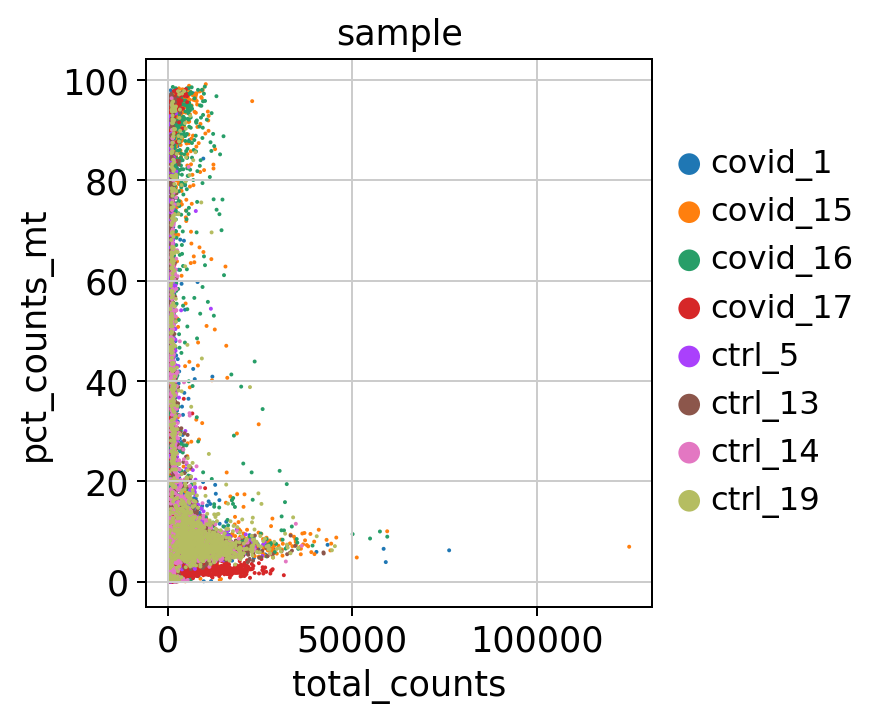

In [ ]:
sc.pl.scatter(adata, x = 'total_counts', y = 'pct_counts_mt', color = 'sample')

## Filtering

For downstream analysis, it is important to remove noise from the dataset. In this case we can remove cells with few number of detected genes, and thus we keep cells with at least **200** detected genes. Also to have enough statistical power we need to have enough observation for given genes and thus we keep genes that are expressed in at least **three** cells.

In [ ]:
sc.pp.filter_cells(adata, min_genes = 200)
sc.pp.filter_genes(adata, min_cells = 3)

filtered out 1336 cells that have less than 200 genes expressed
filtered out 14047 genes that are detected in less than 3 cells


**Isn't it surprising that many genes have been filtered? What do you think could be the reason for this?**

**ANSWER:** A biological explanation for this could be that we have some rare genes, genes that are only detected in very low levels, the sensitivity of the method is too low. (Basically, the genes that correspond to these would be 'noise' or artifacts that we do not care about - could either be a result of technical considerations or it could be biological.)


We can also plot highly expressed genes using `scanpy.pl.highest_expr_genes` methods.

normalizing counts per cell
    finished (0:00:00)


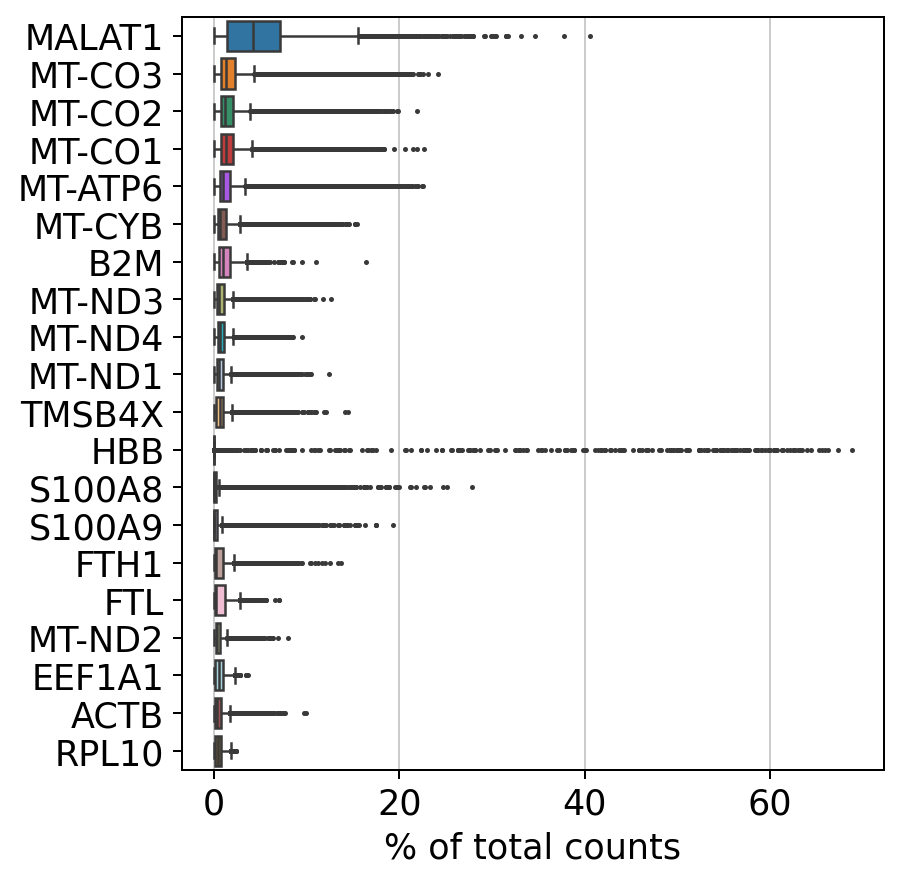

In [ ]:
sc.pl.highest_expr_genes(adata, n_top=20)

_MALAT1_ shows highest expression in this dataset together with mitochondrial genes. _MALAT1_ is a nuclear lincRNA and its high expression may not be surprising, because it is frequently detected in poly-A captured scRNASeq data. In other word, it may be technical issue. Regarding mitochondrial/ribosomal genes, we can filter cells with high expression of these genes. High expression of mitochondrial gene may be indicative of high mortality of cells.

This dataset does not show very high fraction though and by considering `20%` threshold for mitochondrial we will have reasonable number of cells to do downstream analysis.

High fraction of ribosomal genes may also indicate low-quality cells. In this dataset the fraction is not high and we can be less stringent by applying a cut-off of `5%`.   

In [ ]:
adata = adata[adata.obs['pct_counts_mt'] < 20, :]
adata = adata[adata.obs['pct_counts_ribo'] > 5, :]

print("Remaining cells", adata.n_obs)

Remaining cells 7431


Let's look at the data after filtering.  

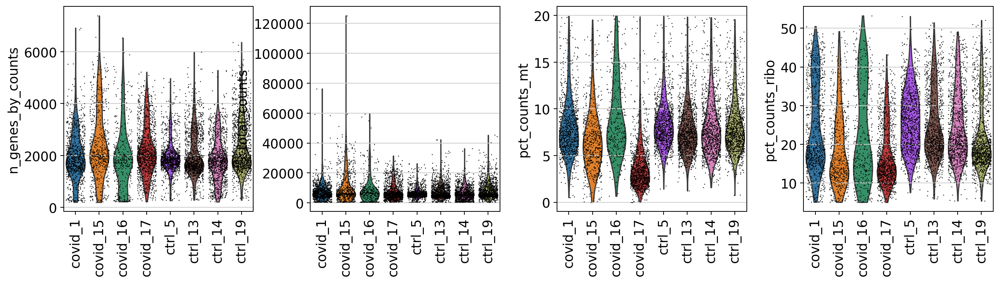

In [ ]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'], jitter=0.4, groupby = 'sample', rotation= 90, multi_panel=False)

**Please explain what has changed in the filtered data distribution compared to the unfiltered data distribution.**

**ANSWER:** As we have filtered out cells that are low quality (pct_mito >=20, pct_ribo <= 5) as well as genes that are not expressed in >3 cells ('noise', less biologically meaningful data), we now see that the difference between sample 15 and 16 with the other samples have become much less prominent (now, quality is comparable between samples), we also see ofc that we have pushed the max of pct_mito down from 100 to 20, removed the large number of cells with very low pct_ribo (which in turn seem to correspond to cells with low n_genes_by_counts and total_counts (which would be an indication of lower quality cells)

### Filtering genes

As the level of expression of mitochondrial and MALAT1 genes are judged as mainly technical, it can be wise to remove them from the dataset before any further analysis. In this case we will also remove the HB genes as HBB has very high expression in some cells.

In [ ]:
malat1 = adata.var_names.str.startswith('MALAT1')
# we need to redefine the mito_genes since they were first
# calculated on the full object before removing low expressed genes.
mito_genes = adata.var_names.str.startswith('MT-')
hb_genes = adata.var_names.str.contains('^HB[^(P|E|S)]')

remove = np.add(mito_genes, malat1)
remove = np.add(remove, hb_genes)
keep = np.invert(remove)

adata = adata[:,keep]

print(adata.n_obs, adata.n_vars)

7431 19468


Now we can save the data after filtering

In [ ]:
# Saving filtered data
adata.write(os.path.join(path_results, "covid_filtered.h5ad"))

## Samples Sex

The sex of the samples is crucial metadata that should be taken into account in the analysis to control for any sex-associated effects. Moreover, inferring the sex of samples using sequencing data can be a good sanity check for potential mislabelling and so on. By evaluating mapping to following features we can determine the sex:  
- X-inactive specific transcript (_XIST_).  
- Y chromosome.  


We can extract the information of these features from annotation file (gtf) or using Biomart in Ensembl. In python (`pybiomart`) you can also directly connect to ensembl database and extract annotation information.    

For gtf format you can read [here](https://nbisweden.github.io/workshop-RNAseq/2403/lab_download.html) (from RNASeq workshop organized by NBIS)

In [ ]:
annot = sc.queries.biomart_annotations("hsapiens", ["ensembl_gene_id", "external_gene_name", "start_position", "end_position", "chromosome_name"], ).set_index("external_gene_name")
annot

,ensembl_gene_id,start_position,end_position,chromosome_name
external_gene_name,,,,
MT-TF,ENSG00000210049,577,647,MT
MT-RNR1,ENSG00000211459,648,1601,MT
MT-TV,ENSG00000210077,1602,1670,MT
MT-RNR2,ENSG00000210082,1671,3229,MT
MT-TL1,ENSG00000209082,3230,3304,MT
...,...,...,...,...
LINC01705,ENSG00000232679,221819842,222064773,1
RNU6-403P,ENSG00000200033,221837334,221837437,1
LINC02474,ENSG00000228437,221966341,221984964,1


With the information of the features we can now extract fraction of reads that mapped to chromosome Y:

In [ ]:
chrY_genes = adata.var_names.intersection(annot.index[annot.chromosome_name == "Y"])
chrY_genes

adata.obs['percent_chrY'] = np.sum(
    adata[:, chrY_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1 * 100

We can directly extract the expression of _XIST_ from `anndata`  object.  

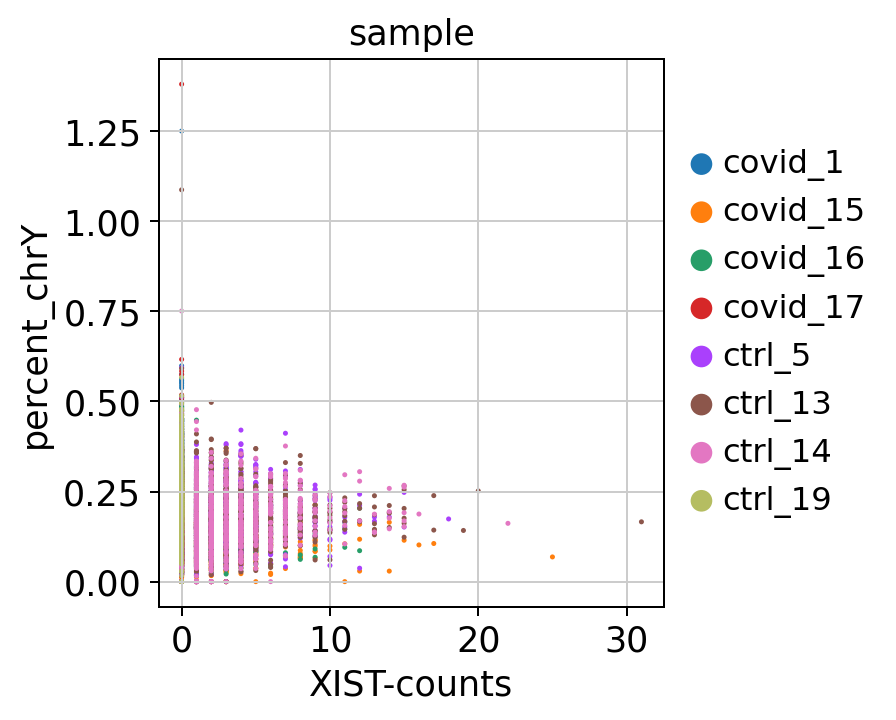

In [ ]:
# color inputs must be from either .obs or .var, so add in XIST expression to obs.
adata.obs["XIST-counts"] = adata.X[:,adata.var_names.str.match('XIST')].toarray()

sc.pl.scatter(adata, x='XIST-counts', y='percent_chrY', color="sample")

Now we can plot _XIST_ expression for all the samples

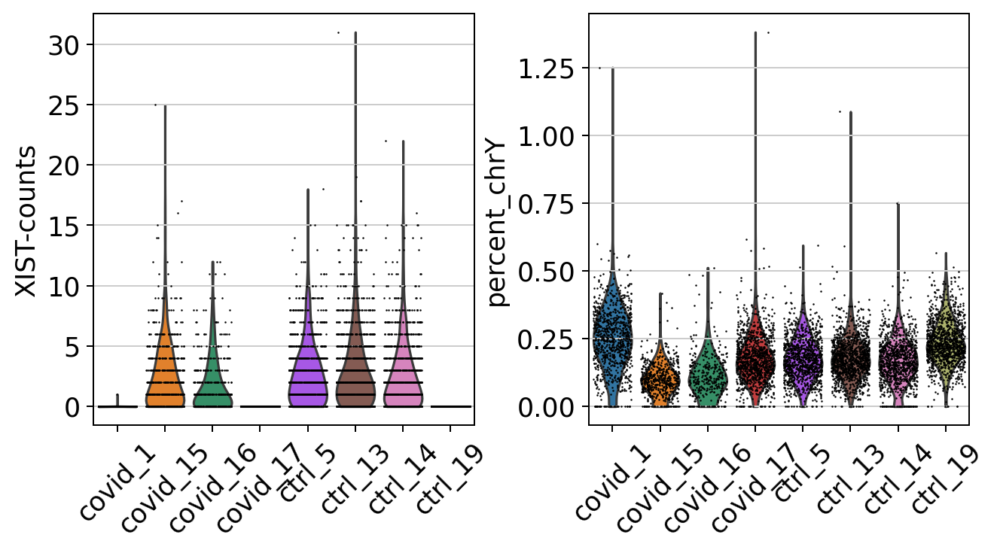

In [ ]:
sc.pl.violin(adata, ["XIST-counts", "percent_chrY"], jitter=0.4, groupby = 'sample', rotation= 45)

Now, can you see which samples are feamle/male?

**ANSWER:** If no XIST -> likely to be male as males fo no require XIST for X chromosome dosage compensation -> potentially covid 1, 16 and ctr 19 male.
Further supported by pct_Y highest in covid 1, 16 further supports this claim.bold text

## Doublet detection

Doublets of cells are is a common feature in scRNASeq where cells in the same well/droplet are sequenced together. They are either homotypic (from the same cell type) or heterotypic (from different cell types). Dependent on the technology, there can be an expected proportion of doublets. In 10x technology this proportion is linearly correlated with the number of loaded cells.

| Multiplet Rate (%) | # of Cells Loaded | # of Cells Recovered |
|--------------------|-------------------|----------------------|
| ~0.4%              | ~870              | ~500                 |
| ~0.8%              | ~1700             | ~1000                |
| ~1.6%              | ~3500             | ~2000                |
| ~2.3%              | ~5300             | ~3000                |
| ~3.1%              | ~7000             | ~4000                |
| ~3.9%              | ~8700             | ~5000                |
| ~4.6%              | ~10500            | ~6000                |
| ~5.4%              | ~12200            | ~7000                |
| ~6.1%              | ~14000            | ~8000                |
| ~6.9%              | ~15700            | ~9000                |
| ~7.6%              | ~17400            | ~10000               |


One of the approaches to detect doublets, is by simulating doublets. Artificial doublets are randomly subsampled in pairs and their gene expression is averaged to obtain doublets counts. The new artifical doublets are projected together with the original cells into a lower dimensional principle space. Then a doublet score based on numnber of artificial doublet neighbors is computed in the k nearest neighbour graph.

Most such packages need an assumption about the number/proportion of expected doublets in the dataset. The data you are using is subsampled, but the original datasets contained about 5 000 cells per sample, hence we can assume that they loaded about 9 000 cells and should have a doublet rate at about 4%.

`scrublet`  is a tool which is used to identify doublets. This tool works with raw counts saved in `adata.X`.   

**Note: that doublet detection should be done for each sample separately.**   

To do that we will split the data in a loop and run ` scrublet`  for each sample and add the detected doublets to the `adata`  object.     

![doublet_detection.jpeg](https://ddls.aicell.io/course/ddls-2024/module-3/doublet_detection.jpeg)

_Artificial doublets are randomly subsampled in pairs and their gene expression is averaged to obtain doublets counts. The new artifical doublets are projected together with the original cells into a lower dimensional principle space. Then a doublet score based on numnber of artificial doublet neighbors is computed in the k nearest neighbour graph._

In [ ]:
import scrublet as scr

# split per batch into new objects.
batches = adata.obs['sample'].cat.categories.tolist()
alldata = {}
for batch in batches:
    tmp = adata[adata.obs['sample'] == batch,]
    print(batch, ":", tmp.shape[0], " cells")
    scrub = scr.Scrublet(tmp.X)
    out = scrub.scrub_doublets(verbose=False, n_prin_comps = 20)
    alldata[batch] = pd.DataFrame({'doublet_score':out[0],'detected_doublets':out[1]},index = tmp.obs.index)
    print(alldata[batch].detected_doublets.sum(), " detected_doublets")

# add predictions to the adata object.
scrub_pred = pd.concat(alldata.values())
adata.obs['doublet_scores'] = scrub_pred['doublet_score']
adata.obs['detected_doublets'] = scrub_pred['detected_doublets']

print('Total doublets:' , sum(adata.obs['detected_doublets']))

covid_1 : 900  cells
23  detected_doublets
covid_15 : 599  cells
8  detected_doublets
covid_16 : 373  cells
2  detected_doublets
covid_17 : 1101  cells
17  detected_doublets
ctrl_5 : 1052  cells
38  detected_doublets
ctrl_13 : 1173  cells
50  detected_doublets
ctrl_14 : 1063  cells
20  detected_doublets
ctrl_19 : 1170  cells
35  detected_doublets
Total doublets: 193


When two cells are sequenced with one cell barcode, we should expect that there is high number of detected cells under single cell (barcode).

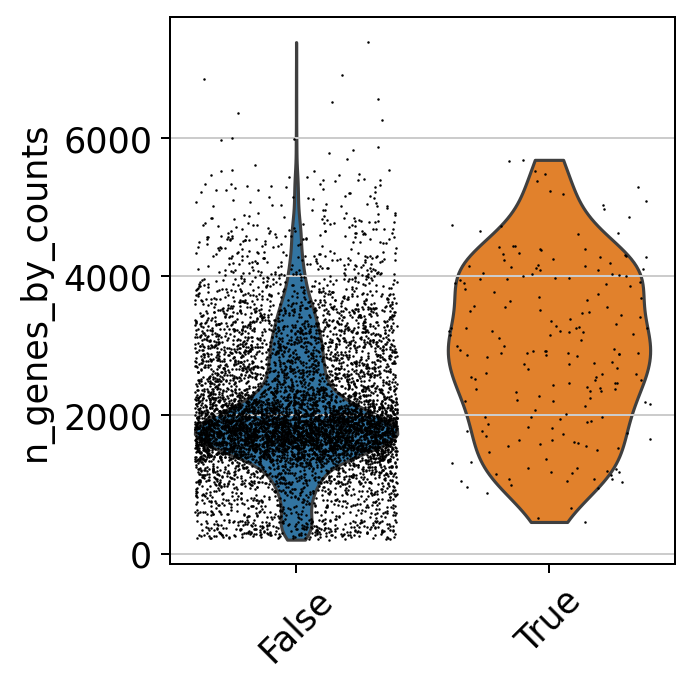

In [ ]:
# add in column with singlet/doublet instead of True/Fals
%matplotlib inline

adata.obs['doublet_info'] = adata.obs["detected_doublets"].astype(str)
sc.pl.violin(adata, 'n_genes_by_counts', jitter=0.4, groupby = 'doublet_info', rotation=45)
adata.write(os.path.join(path_results, "covid_filtered_removed_doublets.h5ad"))

In order to show the distribution of doublets among all the cells, we will do the following step:
- Normalize and scale the data.  
- Dimensionality reduction (you will read further below).  
- Creating UMAP (you will read further below).  

**Note: When you normalize the data the `data`  slot will be overwritten with the normalized counts.**  
In order to have a copy of the raw data you can save it in a new variable (`adata.raw`).  

If you want to identify the distribution of doublet among cells in reduced dimenstional space, run the following chunk.  
We will do this in dionsionality reduction step, further down.

In [ ]:
adata = sc.read_h5ad(os.path.join(path_results, "covid_filtered_removed_doublets.h5ad"))

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:05)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:44)
computing PCA
    with n_comps=50
    finished (0:00:13)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
computing UMAP
    finished: 

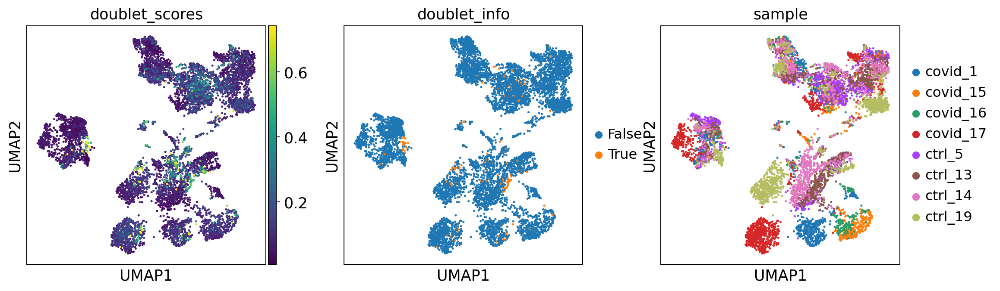

In [ ]:
# save normalized counts in raw slot.
adata.raw = adata
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

# normalize to depth 10 000
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

# logaritmize
sc.pp.log1p(adata)

# Identifying highly variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['doublet_scores','doublet_info','sample'])

Now we can remove all the detected doublets

In [ ]:
# also revert back to the raw counts as the main matrix in adata
adata = adata.raw.to_adata()

adata = adata[adata.obs['doublet_info'] == 'False',:]
print(adata.shape)
#Saving the filtered object
adata.write_h5ad(os.path.join(path_results, "covid_filtered_removed_doublets.h5ad"))


(7238, 19468)


## Cell cycle state

There are gene markers by which we can score the cell cycle state. The algorithm calculates the difference of mean expression of the given list and the mean expression of reference genes. To build the reference, the function randomly chooses a bunch of genes matching the distribution of the expression of the given list. Cell cycle scoring adds three slots in the metadata, a score for S phase, a score for G2M phase and the predicted cell cycle phase.  

First read the file with cell cycle genes, from Regev lab and split into S and G2M phase genes. We first download the file.  

In [ ]:
print(url_data)

https://export.uppmax.uu.se/naiss2023-23-3/workshops/workshop-scrnaseq/covid/


In [ ]:
path_file = os.path.join(path_results, 'regev_lab_cell_cycle_genes.txt')
if not os.path.exists(path_file):
    urllib.request.urlretrieve(os.path.join(url_data+'results/', 'regev_lab_cell_cycle_genes.txt'), path_file)

In [ ]:
cell_cycle_genes = [x.strip() for x in open(os.path.join(path_results, "regev_lab_cell_cycle_genes.txt"))]
print(len(cell_cycle_genes))

# Split into 2 lists
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
print(len(cell_cycle_genes))

97
94


The data is already normalized and we can perform cell cycle scoring. The function is actually a wrapper to `sc.tl.score_gene_list`, which is launched twice, to score separately S and G2M phases. Both `sc.tl.score_gene_list` and` sc.tl.score_cell_cycle_genes` are a port from Seurat and are supposed to work in a very similar way.

In [ ]:
#adata = sc.read_h5ad(os.path.join(path_results, ('scanpy_covid_qc.h5ad')))
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    772 total control genes are used. (0:00:01)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    769 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


Let's check the cell cycle scores in plots.  

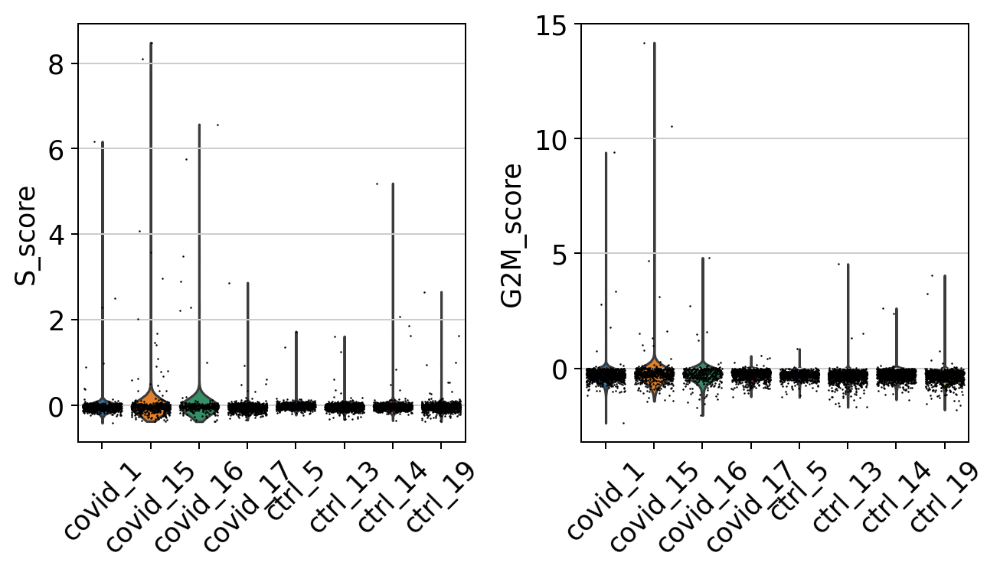

In [ ]:
sc.pl.violin(adata, ['S_score', 'G2M_score'], jitter=0.4, groupby = 'sample', rotation=45)

In this case it looks like we only have a few cycling cells in these datasets and we do not need to regress out the cell cycle effect.

Scanpy does an automatic prediction of cell cycle phase with a default cutoff of the scores at zero. As you can see this does not fit this data very well, so be cautios with using these predictions. Instead we suggest that you look at the scores.

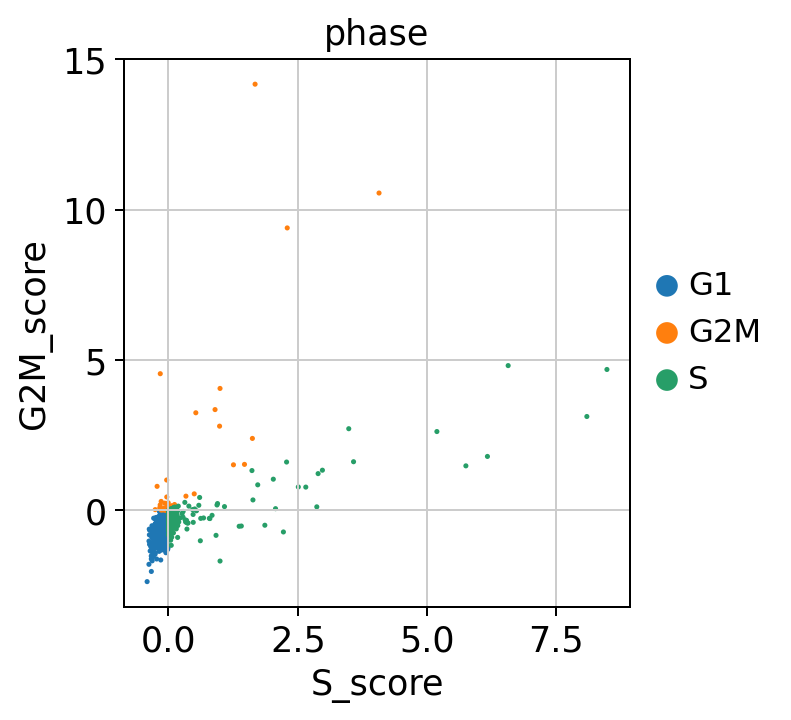

In [ ]:
sc.pl.scatter(adata, x='S_score', y='G2M_score', color="phase")

In [ ]:
adata.write_h5ad(os.path.join(path_results, "covid_filtered_removed_doublets_cell_cycle.h5ad"))

## Feature selection
To reduce the feature dimension and redundancy as well as avoding overfitting in downstream analysis we perform feature selection. By this approach we focus on set of genes that can potentially explain biological variation in the dataset.  

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Highly variable genes: 2622


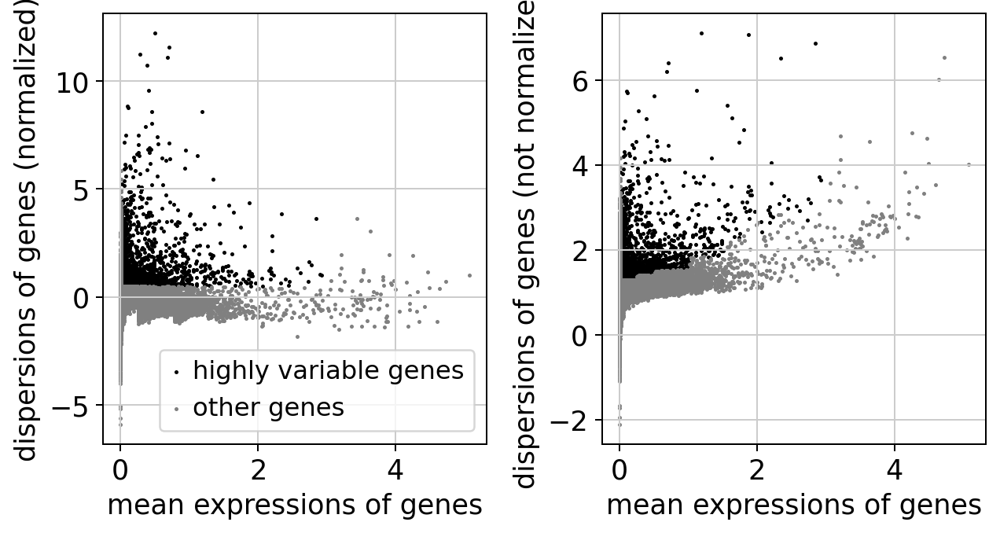

In [ ]:
# Load the data filtered data
adata = sc.read_h5ad(os.path.join(path_results, "covid_filtered_removed_doublets_cell_cycle.h5ad"))
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

# logaritmize
sc.pp.log1p(adata)


# store normalized counts in the raw slot,
# we will subset adata.X for variable genes, but want to keep all genes matrix as well.
adata.raw = adata

# Identifying highly variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

print("Highly variable genes: %d"%sum(adata.var.highly_variable))

#plot variable genes
sc.pl.highly_variable_genes(adata)

# subset for variable genes in the dataset
adata = adata[:, adata.var['highly_variable']]

## Diomensionality reduction

After feature selection, we can still reduce the complexity (dimenstion) of the data using different algorithms:   
- PCA (Linear)  
- t-SNE & UMAP (non-linear)  

### PCA
To do this we first perform PCA and then plot the PCs (PC1 - PC7)  

computing PCA
    with n_comps=50
    finished (0:00:02)


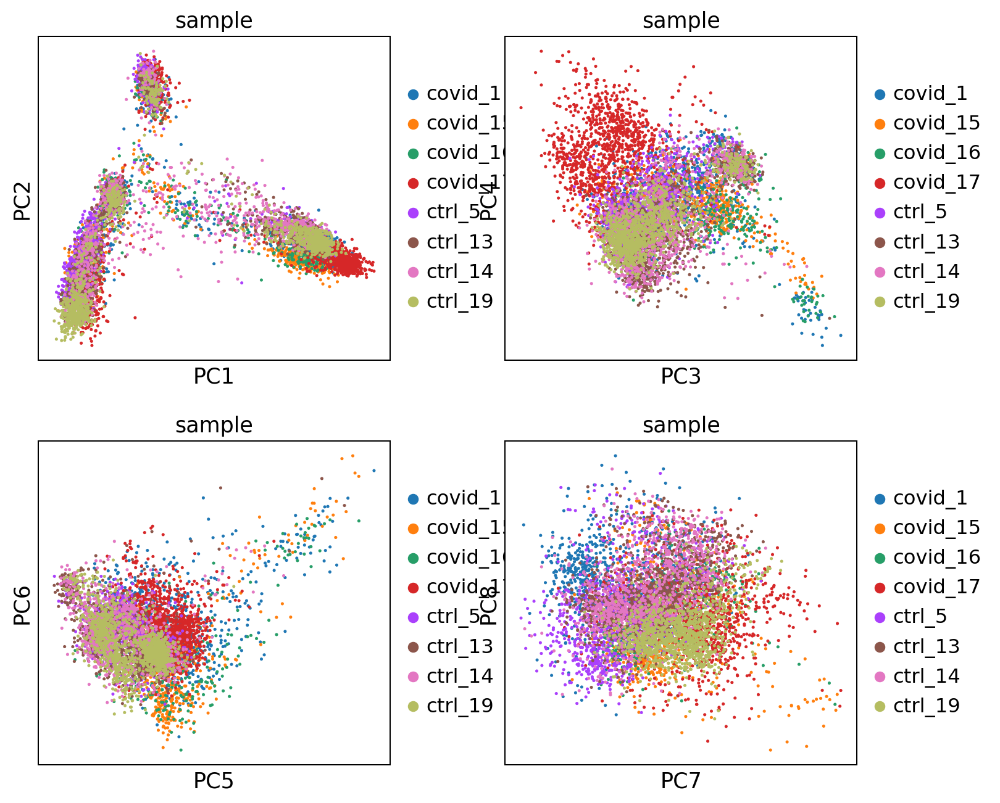

In [ ]:
# Calculating PCs
sc.tl.pca(adata, svd_solver='arpack')
# Visualising PCs
sc.pl.pca(adata, color='sample', components = ['1,2','3,4','5,6','7,8'], ncols=2)

You can also check which genes contributed to the capture variation in each PCs  

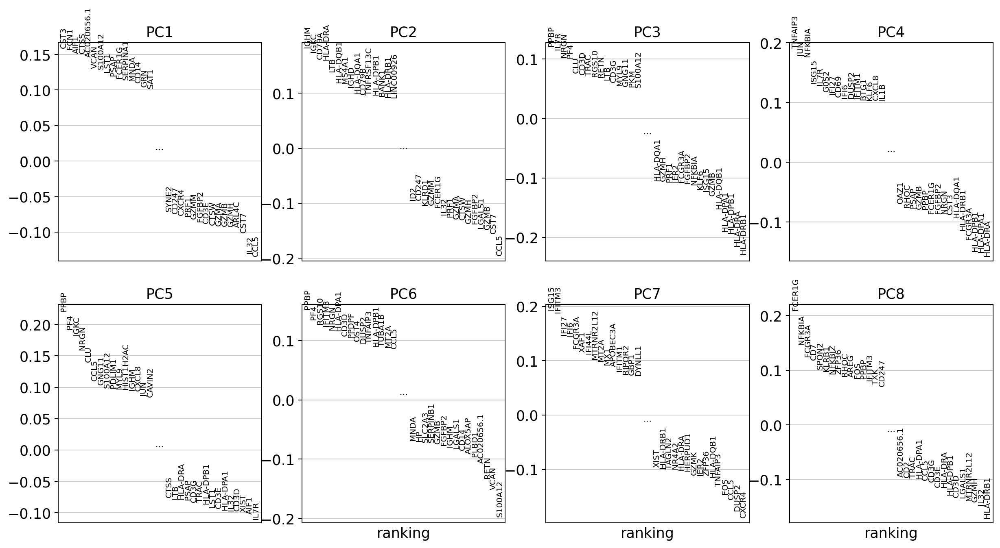

In [ ]:
sc.pl.pca_loadings(adata, components=[1,2,3,4,5,6,7,8])
# OBS! only plots the positive axes genes from each PC!!

Remember that not all the PCs can capture large fraction of the variance and can be discarded. By ranking the PCs we can identify elbow pattern and exclude them.

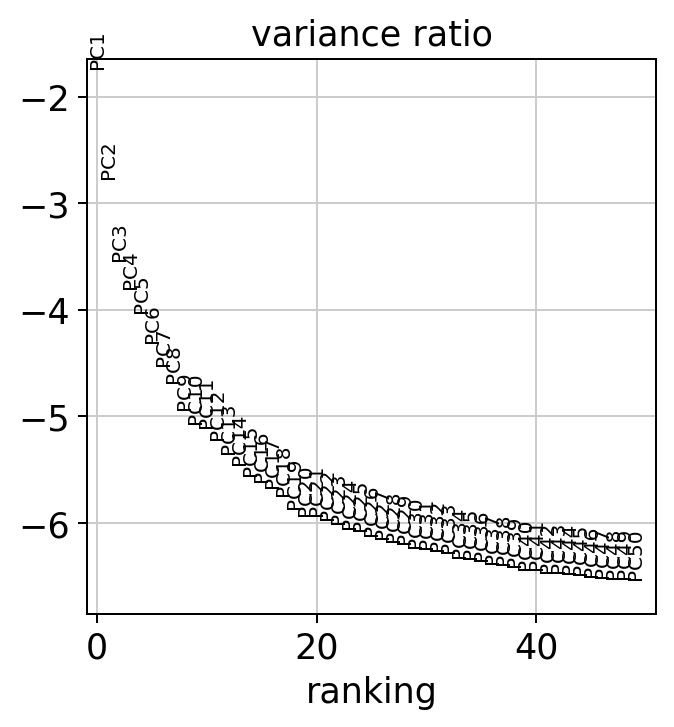

In [ ]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs = 50)

Top 21 PCs explain large fraction of variation or in other words retain a lot of information, while the rest of the PCs contain progressively less information. That said, it is still recommended to use more PCs since they can explain larger fraction of the variation and help to characterise rare cell types (e.g. platelets & DCs in this dataset).

### t-SNE

In [ ]:
sc.tl.tsne(adata, n_pcs = 30)

computing tSNE
    using 'X_pca' with n_pcs = 30
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:01:19)


We plot t-SNE scatterplot colored by sample IDs. As you can see there is a clear pattern of batch effect (there are not much overlap among samples while these samples should have some overlap indicating similar cell types).

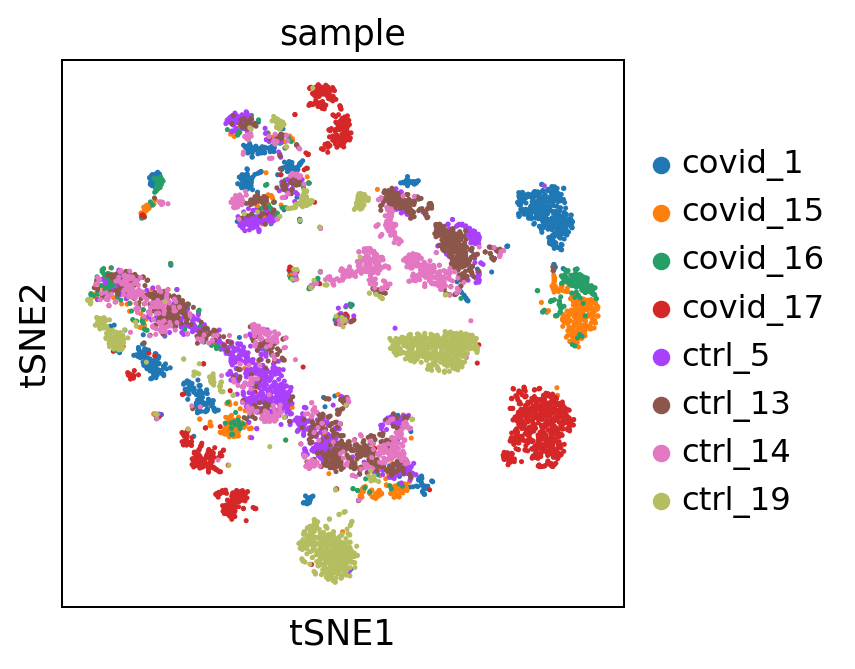

In [ ]:
sc.pl.tsne(adata, color=['sample'])

### UMAP

SCANPY uses a neighbourhood graph as the distance matrix, so we need to first calculate the graph.

In [ ]:
sc.pp.neighbors(adata, n_pcs=30, n_neighbors = 30)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


Now we run UMAP for all cell embeddings.

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:19)


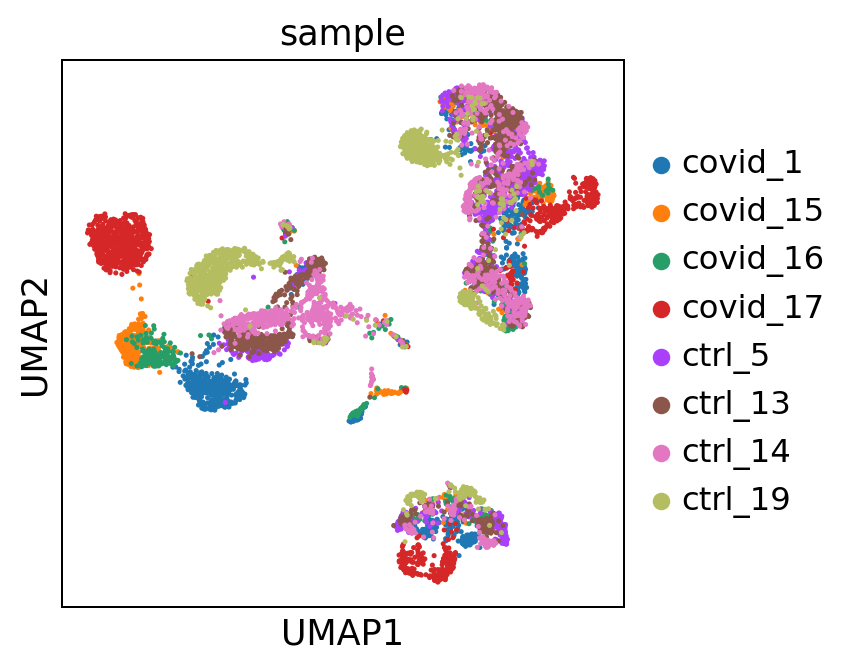

In [ ]:
sc.tl.umap(adata)
sc.pl.umap(adata, color = 'sample')

Here you can again see the batch effect.  
You can also select given number of components to calculate umap and also visualise neighbour edges, which shows the distance or connection among the cells dependent on their expression profile (?=??)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:24)


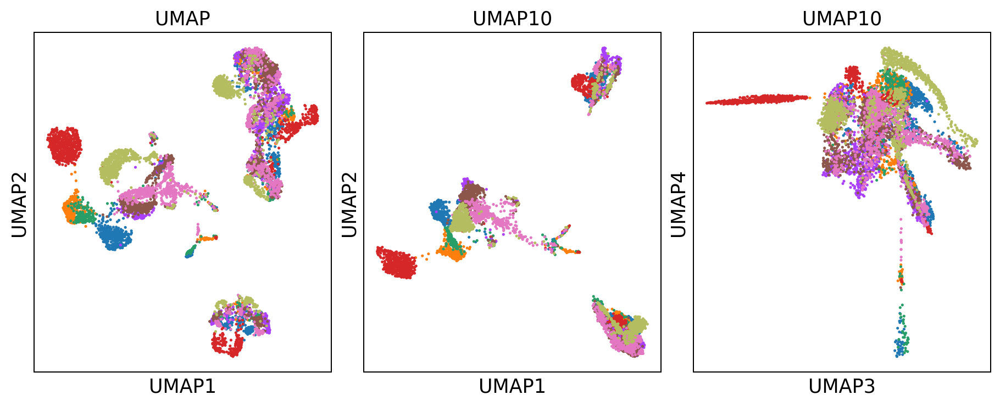

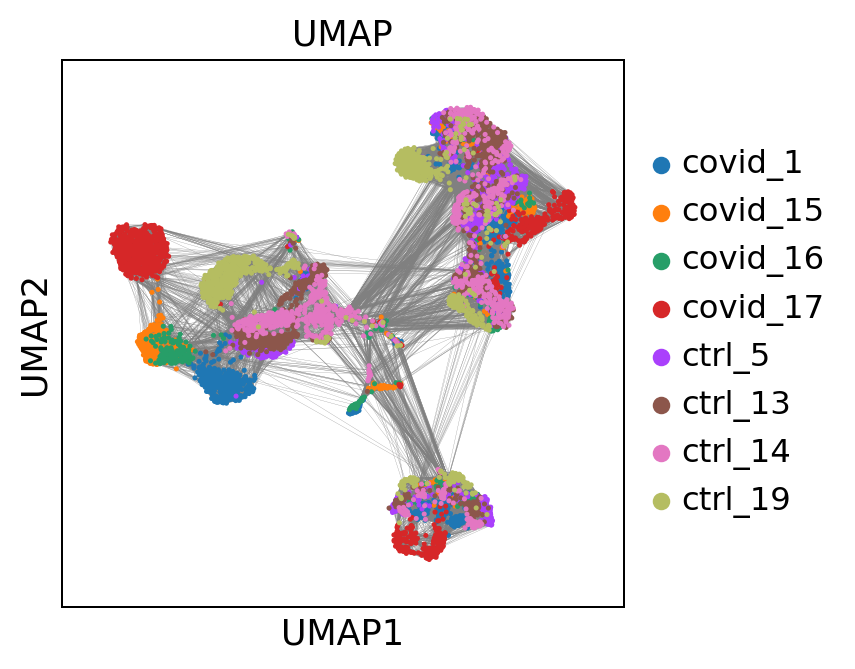

In [ ]:
# run with 10 components, save to a new object so that the umap with 2D is not overwritten.
umap10 = sc.tl.umap(adata, n_components=10, copy=True)
fig, axs = plt.subplots(1, 3, figsize=(10, 4), constrained_layout=True)

sc.pl.umap(adata, color='sample',  title="UMAP",
           show=False, ax=axs[0], legend_loc=None)
sc.pl.umap(umap10, color='sample', title="UMAP10", show=False,
           ax=axs[1], components=['1,2'], legend_loc=None)
sc.pl.umap(umap10, color='sample', title="UMAP10",
           show=False, ax=axs[2], components=['3,4'], legend_loc=None)

# we can also plot the umap with neighbor edges
sc.pl.umap(adata, color='sample', title="UMAP", edges=True)

Now let's compare different approaches for dimensionality reduction (PCA, t-SNE, and UMAP).
Probably one of the main conclusion is presence of the batch effect and can have a strong impact on downstream analysis (differential gene expression).

<Axes: title={'center': 'sample'}, xlabel='UMAP1', ylabel='UMAP2'>

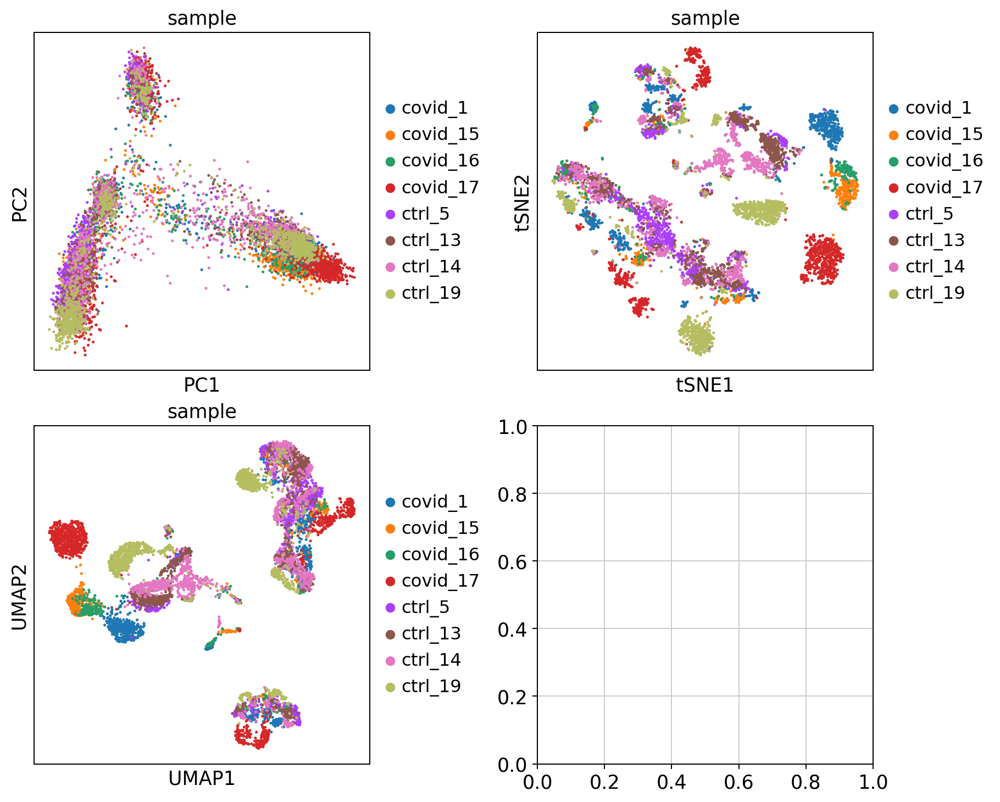

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(10, 8), constrained_layout=True)
sc.pl.pca(adata, color='sample', components=['1,2'], ax=axs[0, 0], show=False)
sc.pl.tsne(adata, color='sample', components=['1,2'], ax=axs[0, 1], show=False)
sc.pl.umap(adata, color='sample', components=['1,2'], ax=axs[1, 0], show=False)

What else can you see? Do you see any difference or similarity? Write down your observations below.

**ANSWER:** As pca assumes linar relationship in data, the clusters can become less distinct if there are non-linear relationships in the data (as can be seen here too). As global variance is in focus for pca, the axes of maximum variation is clearly distinct.

For tsne, the local similarity (not necessarily linear as in pca) of the data points is in focus, resulting in many small clusters (the within-cluster similarity is probably high, but the global structure is lost). Compared to pca or umap, this would be the method which gives the most scattered clusters.

UMAP tries to both cluster points by local similariy as well as preserve global structure. Hence, for example, we can see some similarity of umap capturing 3 clusters as in pca, but also see smaller clusters of local similarity in data too (eg, clusters of only red or yellow).

Now we can visulaise QC metrics in the generated UMAP.

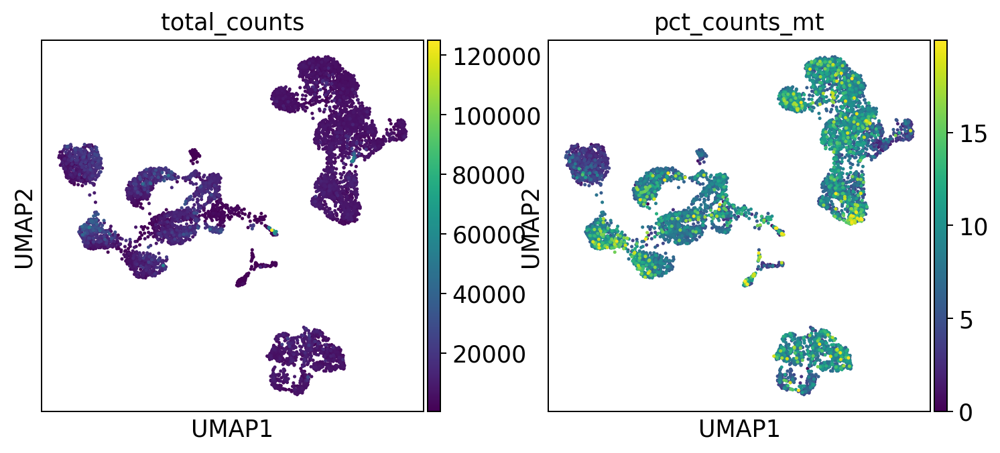

In [ ]:
sc.pl.umap(
    adata,
    color=["total_counts", "pct_counts_mt"],
)

Or visualise genes of interest

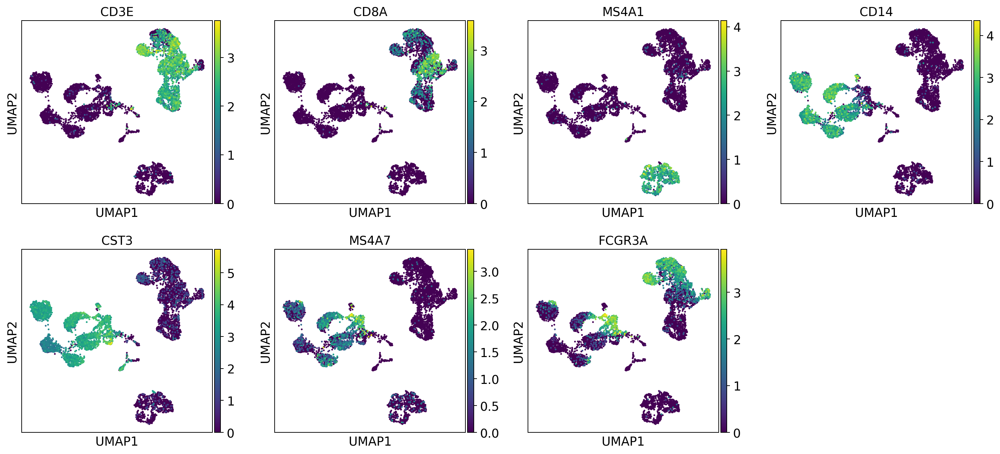

In [ ]:
sc.pl.umap(adata,
           color=["CD3E", "CD8A", "MS4A1","CD14",
                  "CST3","MS4A7","FCGR3A"])

Saving the object.

In [ ]:
adata.write_h5ad(os.path.join(path_results, "covid_filtered_removed_doublets_dr.h5ad"))

## Data Integration (Batch correction)

In [ ]:
adata2 = adata.raw.to_adata()

# in some versions of Anndata there is an issue with information on the logtransformation in the slot log1p.base so we set it to None to not get errors.
adata2.uns['log1p']['base']=None

# check that the matrix looks like normalized counts
print(adata2.X[1:10,1:10])

  (0, 3)	0.7825693876867097
  (7, 6)	1.1311041336746985


### Detection of variable genes

In [ ]:
var_genes_all = adata.var.highly_variable

print("Highly variable genes: %d"%sum(var_genes_all))

Highly variable genes: 2622


Now, we extract variable genes in each sample using `batch_key` parameter.

In [ ]:
sc.pp.highly_variable_genes(adata2, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key = 'sample')

print("Highly variable genes intersection: %d"%sum(adata2.var.highly_variable_intersection))

print("Number of batches where gene is variable:")
print(adata2.var.highly_variable_nbatches.value_counts())

var_genes_batch = adata2.var.highly_variable_nbatches > 0

extracting highly variable genes
    finished (0:00:05)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Highly variable genes intersection: 122
Number of batches where gene is variable:
highly_variable_nbatches
0    7870
1    4131
2    3194
3    2030
4    1114
5     553
6     280
7     174
8     122
Name: count, dtype: int64


In [ ]:
print("Any batch var genes: %d"%sum(var_genes_batch))
print("All data var genes: %d"%sum(var_genes_all))
print("Overlap: %d"%sum(var_genes_batch & var_genes_all))
print("Variable genes in all batches: %d"%sum(adata2.var.highly_variable_nbatches == 6))
print("Overlap batch instersection and all: %d"%sum(var_genes_all & adata2.var.highly_variable_intersection))

Any batch var genes: 11598
All data var genes: 2622
Overlap: 2621
Variable genes in all batches: 280
Overlap batch instersection and all: 122


Select all genes that are variable in at least 2 datasets and use for remaining analysis.

In [ ]:
var_select = adata2.var.highly_variable_nbatches > 2
var_genes = var_select.index[var_select]
len(var_genes)

4273

### Harmony

We use `Harmony`  to integrate the data.  

In [ ]:
sce.pp.harmony_integrate(adata2, 'sample')

adata2.obsm['X_pca'] = adata2.obsm['X_pca_harmony']
sc.pp.neighbors(adata2, n_neighbors=10, n_pcs=30)
sc.tl.umap(adata2)
sc.tl.leiden(adata2, resolution=0.5)

2024-09-11 12:39:26,596 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2024-09-11 12:39:36,813 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2024-09-11 12:39:36,878 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2024-09-11 12:39:39,946 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2024-09-11 12:39:44,017 - harmonypy - INFO - Iteration 3 of 10
INFO:harmonypy:Iteration 3 of 10
2024-09-11 12:39:53,767 - harmonypy - INFO - Iteration 4 of 10
INFO:harmonypy:Iteration 4 of 10
2024-09-11 12:40:03,695 - harmonypy - INFO - Iteration 5 of 10
INFO:harmonypy:Iteration 5 of 10
2024-09-11 12:40:08,808 - harmonypy - INFO - Converged after 5 iterations
INFO:harmonypy:Converged after 5 iterations


computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


Now we  replot the UMAP after integration. You can see that the cells have been overlap.

<Axes: title={'center': 'Uncorrected umap'}, xlabel='UMAP1', ylabel='UMAP2'>

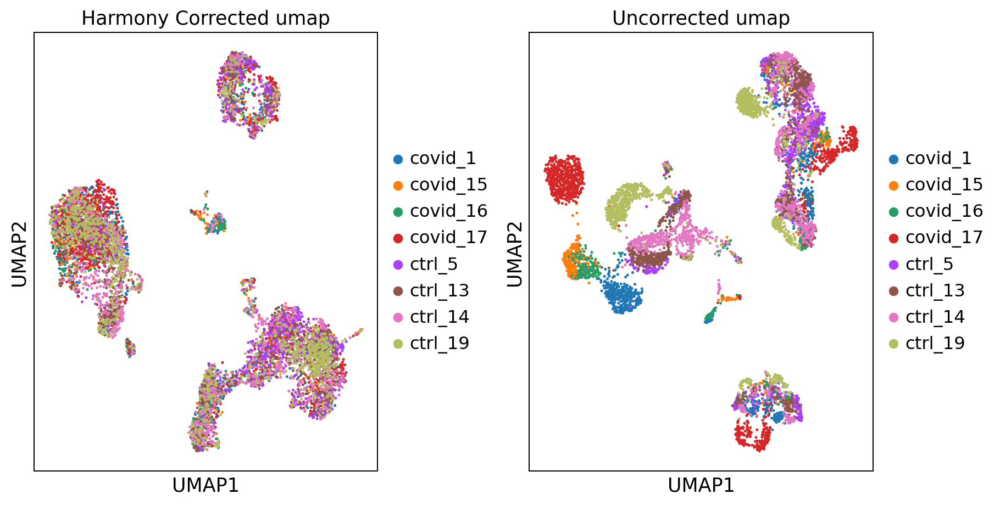

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10,5),constrained_layout=True)
sc.pl.umap(adata2, color="sample", title="Harmony Corrected umap", ax=axs[0], show=False)
sc.pl.umap(adata, color="sample", title="Uncorrected umap", ax=axs[1], show=False)

Let’s save the integrated data for further analysis.

In [ ]:
adata2.write_h5ad(os.path.join(path_results, "covid_filtered_removed_doublets_dr_harmony.h5ad"))

### BBKNN

BBKNN (Batch Balanced K-Nearest Neighbors) is another method used in the analysis of single-cell RNA sequencing (scRNA-seq) data to address batch effects during dimensionality reduction and clustering.

In [ ]:
adata_bbkn = adata.raw.to_adata()

# in some versions of Anndata there is an issue with information on the logtransformation in the slot log1p.base so we set it to None to not get errors.
adata_bbkn.uns['log1p']['base']=None

bbknn.bbknn(adata_bbkn,batch_key='sample')

# then run umap on the integrated space
sc.tl.umap(adata_bbkn)
sc.tl.tsne(adata_bbkn)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:18)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:01:26)


Plots

<Axes: title={'center': 'Uncorrected umap'}, xlabel='UMAP1', ylabel='UMAP2'>

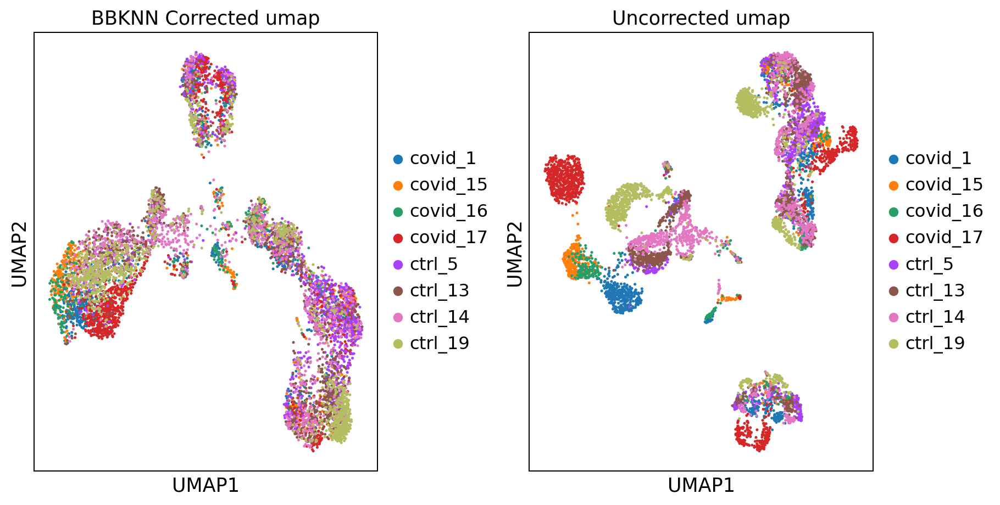

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10,5),constrained_layout=True)
sc.pl.umap(adata_bbkn, color="sample", title="BBKNN Corrected umap", ax=axs[0], show=False)
sc.pl.umap(adata, color="sample", title="Uncorrected umap", ax=axs[1], show=False)

Let’s save the integrated data for further analysis.

In [ ]:
adata2.write_h5ad(os.path.join(path_results, "covid_filtered_removed_doublets_dr_bbknn.h5ad"))

### Combat
Batch correction can also be performed using `ComBat`, a method widely used for batch effect correction in both scRNASeq and bulk RNASeq data. It's important to note that `ComBat` requires the input data to be in a dense matrix format, which is already the case in this example.

In [ ]:
# create a new object with lognormalized counts
adata_combat = sc.AnnData(X=adata.raw.X, var=adata.raw.var, obs = adata.obs)

# first store the raw data
adata_combat.raw = adata_combat

# run combat
sc.pp.combat(adata_combat, key='sample')

Standardizing Data across genes.

Found 8 batches

Found 0 numerical variables:
	

Found 39 genes with zero variance.
Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data



To generate figures we require to rerun the standard steps as before:
- Vairable gene selection
- Calculating PCs
- t-SNE & UMAP

extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Highly variable genes: 3929


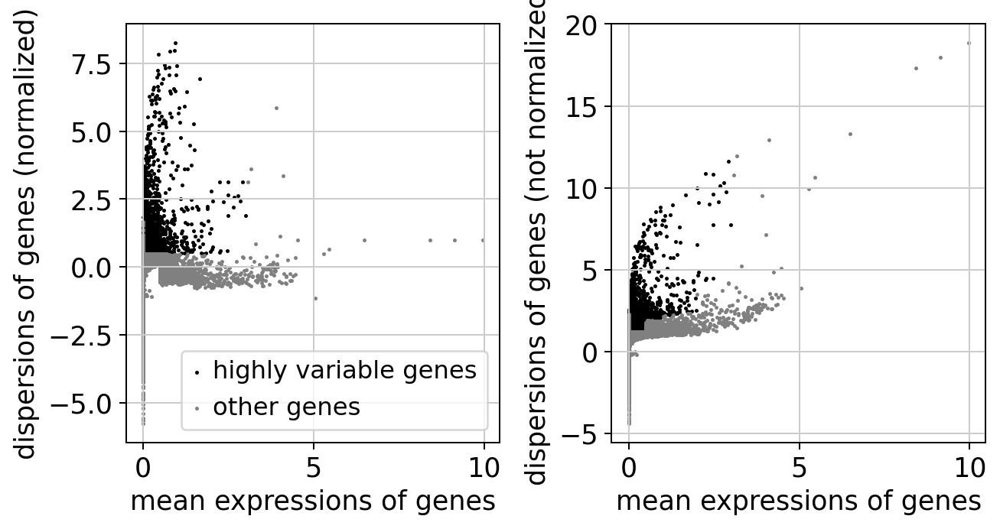

computing PCA
    with n_comps=30
    finished (0:00:09)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)
computing tSNE
    using 'X_pca' with n_pcs = 30
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:02:01)


In [ ]:
sc.pp.highly_variable_genes(adata_combat)
print("Highly variable genes: %d"%sum(adata_combat.var.highly_variable))
sc.pl.highly_variable_genes(adata_combat)

sc.pp.pca(adata_combat, n_comps=30, use_highly_variable=True, svd_solver='arpack')

sc.pp.neighbors(adata_combat)

sc.tl.umap(adata_combat)
sc.tl.tsne(adata_combat)

We plot integrated and unintegrated data by using `ComBat`.

<Axes: title={'center': 'Uncorrected umap'}, xlabel='UMAP1', ylabel='UMAP2'>

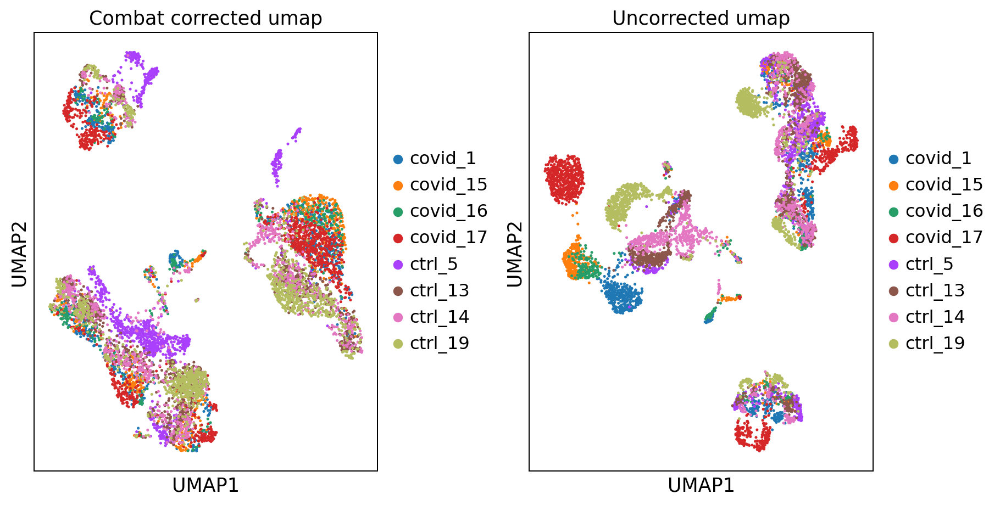

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10,5),constrained_layout=True)
sc.pl.umap(adata_combat, color="sample", title="Combat corrected umap", ax=axs[0], show=False)
sc.pl.umap(adata, color="sample", title="Uncorrected umap", ax=axs[1], show=False)

Let’s save the integrated data for further analysis.

In [ ]:
adata2.write_h5ad(os.path.join(path_results, "covid_filtered_removed_doublets_dr_combat.h5ad"))

Now let's plot the output of all of the integration methods

<Axes: title={'center': 'Uncorrected umap'}, xlabel='UMAP1', ylabel='UMAP2'>

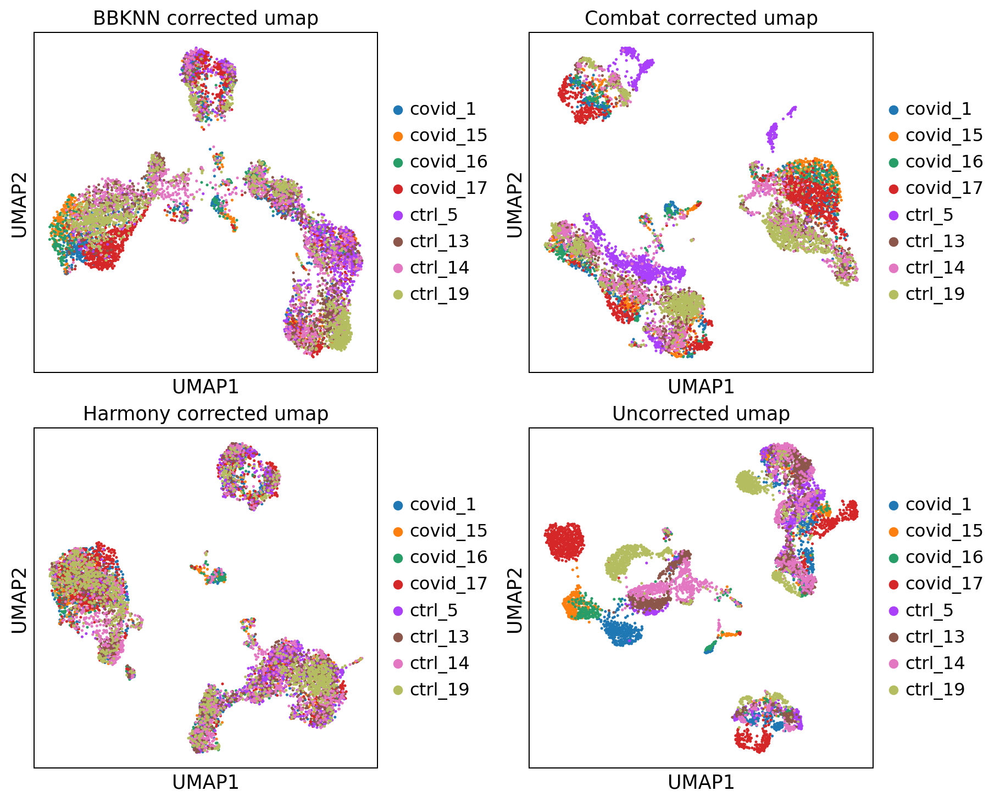

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(10,8),constrained_layout=True)
sc.pl.umap(adata_bbkn, color="sample", title="BBKNN corrected umap", ax=axs[0,0], show=False)
sc.pl.umap(adata_combat, color="sample", title="Combat corrected umap", ax=axs[0,1], show=False)
sc.pl.umap(adata2, color="sample", title="Harmony corrected umap", ax=axs[1,0], show=False)
sc.pl.umap(adata, color="sample", title="Uncorrected umap", ax=axs[1,1], show=False)

## Clustering
Clustering is an unsupervised machine learning problem. We lable clusters by minimizing the intra-cluster distance in the reduced expression space. In this exercise, we use Leiden algorithm for clustering which is an improved version of Louvian algorithm (read more [here]()).

There are different approaches in clustering:
- Graph-based:
- K-means:
- Hierarchical:

**NOTE:** Louvian algorithm is no longer maintained.

It is done in three steps:  
- Build a kNN graph from the data.  
- Prune spurious connections from kNN graph (optional step). This is a SNN graph.  
- Find groups of cells that maximizes the connections within the group compared other groups.  

If you recall from the integration, we already constructed a knn graph before running UMAP. Hence we do not need to do it again, and can run the community detection right away.

The modularity optimization algoritm in Scanpy are Leiden and Louvain. Lets test both and see how they compare.

**NOTE:** Please note that we will be working with `harmony` integration output

### Leiden


In [ ]:
# Loading the anndata with integration by harmony
adata = sc.read_h5ad(os.path.join(path_results, "covid_filtered_removed_doublets_dr_harmony.h5ad"))

In [ ]:
sc.tl.leiden(adata, key_added = "leiden_1.0") # default resolution in 1.0
sc.tl.leiden(adata, resolution = 0.6, key_added = "leiden_0.6")
sc.tl.leiden(adata, resolution = 0.4, key_added = "leiden_0.4")
sc.tl.leiden(adata, resolution = 1.4, key_added = "leiden_1.4")

running Leiden clustering
    finished: found 17 clusters and added
    'leiden_1.0', the cluster labels (adata.obs, categorical) (0:00:03)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:03)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden_1.4', the cluster labels (adata.obs, categorical) (0:00:03)


Plot the clusters: As you can observe, increasing the resolution results in finer granularity within the clustering, allowing for more detailed separation of cell groups. But you need to back it up by biological information you have.

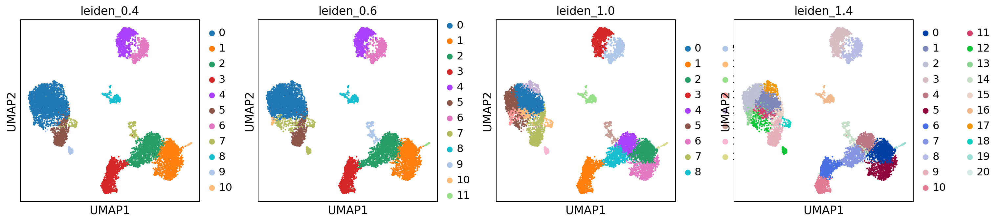

In [ ]:
sc.pl.umap(adata, color=['leiden_0.4', 'leiden_0.6', 'leiden_1.0','leiden_1.4'])

We can show the relationship between clusters by claculating correlation in PCA space.

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_0.6']`


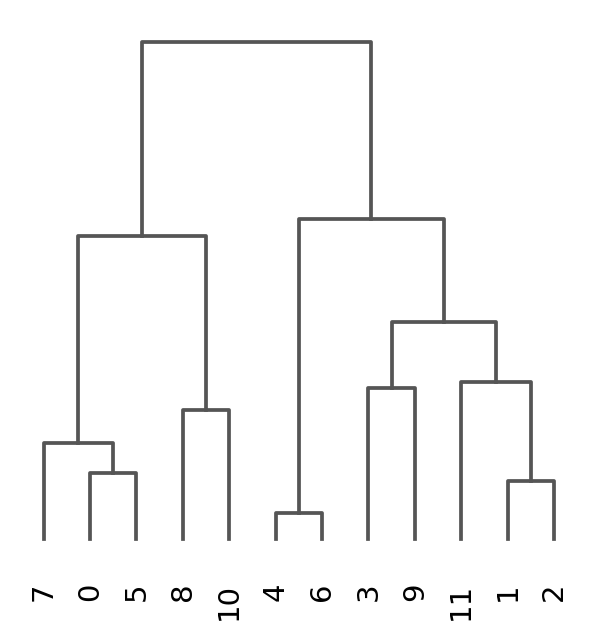

<Axes: >

In [ ]:
sc.tl.dendrogram(adata, groupby = "leiden_0.6")
sc.pl.dendrogram(adata, groupby = "leiden_0.6")

Try to do the same for other resolutions.

As explained above using prior biological information about the system you are studying can come in hand to evaluate the clustering output. For example you can visualise expression of marker genes. Try to do that by using the same genes used in domensionality reduction step.

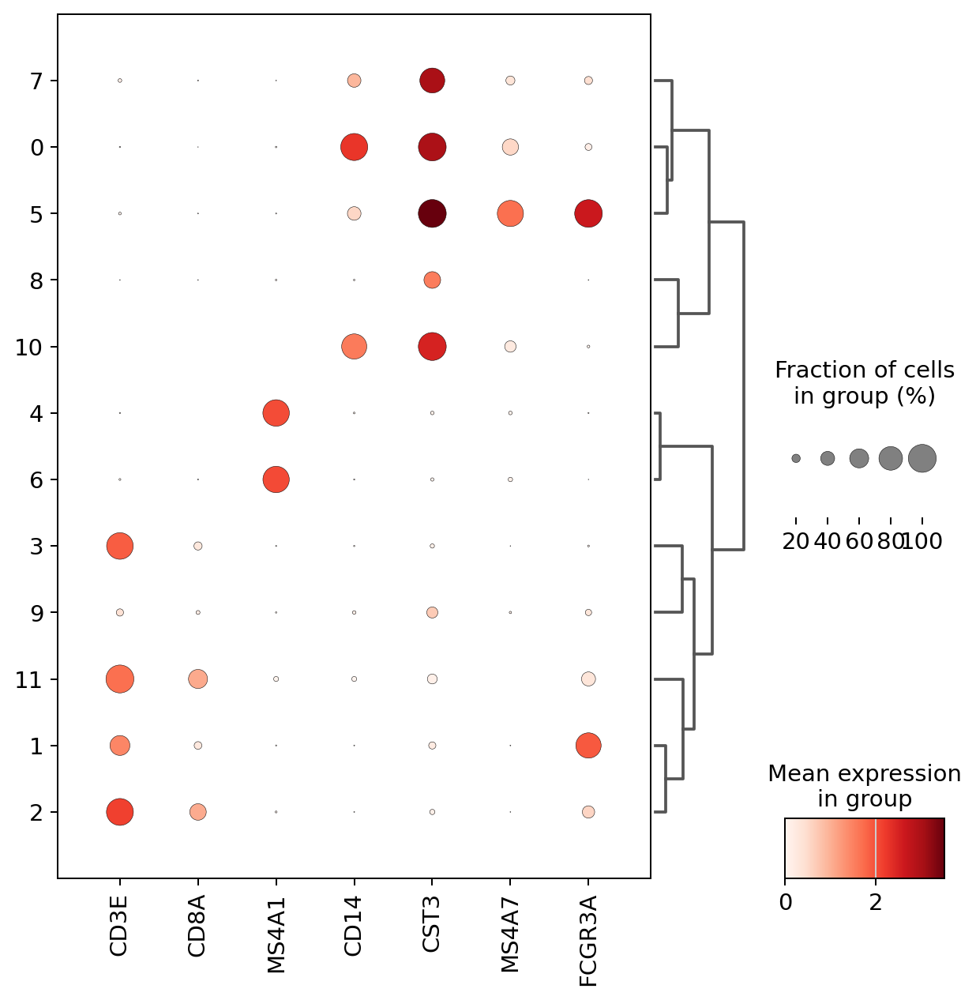

In [ ]:
genes = ["CD3E", "CD8A", "MS4A1","CD14",
                  "CST3","MS4A7","FCGR3A"]
sc.pl.dotplot(adata, genes, groupby='leiden_0.6', dendrogram=True, figsize=(8, 8))

### K-means
In this approach, we first set the number of clusters. It is recommended to run K-means with multiple starting configurations.  

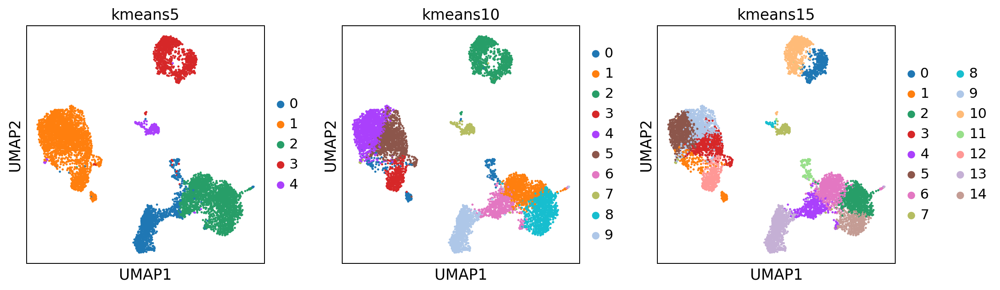

AxisArrays with keys: X_pca, X_pca_harmony, X_tsne, X_umap

In [ ]:
# extract pca coordinates
X_pca = adata.obsm['X_pca_harmony']

# kmeans with k=5
kmeans = KMeans(n_clusters=5, random_state=0).fit(X_pca)
adata.obs['kmeans5'] = kmeans.labels_.astype(str)

# kmeans with k=10
kmeans = KMeans(n_clusters=10, random_state=0).fit(X_pca)
adata.obs['kmeans10'] = kmeans.labels_.astype(str)

# kmeans with k=15
kmeans = KMeans(n_clusters=15, random_state=0).fit(X_pca)
adata.obs['kmeans15'] = kmeans.labels_.astype(str)

sc.pl.umap(adata, color=['kmeans5', 'kmeans10', 'kmeans15'])

adata.obsm

### Hierarchical clustering
This method returns higherarchy of partitionings (a dendrogram) that can be cut at different levels in following steps:  
- Calculating distance between **samples** (cells in this case). This distance can be Euclidean distance or corrleation.    
- Defining a measure of distance between **clusters**.  (e.g. `linkage`, `single`, `average` , `median`, `centroid` and `ward`).  
- Defining the dendrogram among all samples using **Bottom-up** or **Top-down** approach. Bottom-up is where samples start with their own cluster which end up merged pair-by-pair until only one cluster is left. Top-down is where samples start all in the same cluster that end up being split by 2 until each sample has its own cluster.   


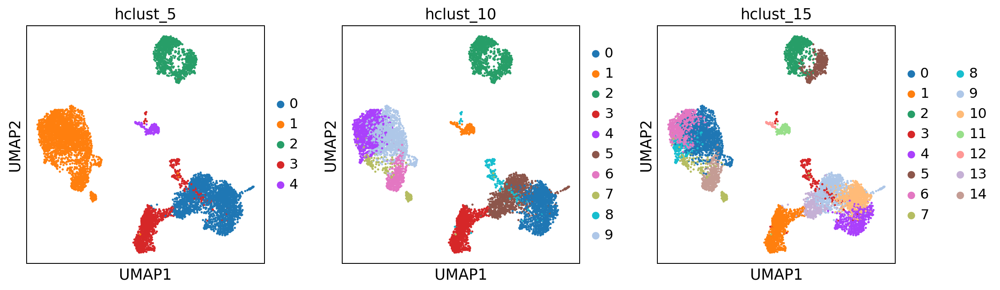

In [ ]:
cluster = AgglomerativeClustering(n_clusters=5, linkage='ward')
adata.obs['hclust_5'] = cluster.fit_predict(X_pca).astype(str)

cluster = AgglomerativeClustering(n_clusters=10, linkage='ward')
adata.obs['hclust_10'] = cluster.fit_predict(X_pca).astype(str)

cluster = AgglomerativeClustering(n_clusters=15, linkage='ward')
adata.obs['hclust_15'] = cluster.fit_predict(X_pca).astype(str)

sc.pl.umap(adata, color=['hclust_5', 'hclust_10', 'hclust_15'])

We now save the clustered data for further analysis.

In [ ]:
adata.write_h5ad(os.path.join(path_results, "covid_filtered_removed_doublets_dr_harmony_cl.h5ad"))

Let's explor the distribution of samples in clusters.  

**Task:**   
- Select the clustering approach of interest (e.g. `leiden_0.6`) and plot proportion of Covid & Control groups in each cluster.  
- Also, show proportion of each sample in each cluster.  

In [ ]:
adata.obs

,type,sample,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,...,leiden_1.0,leiden_0.6,leiden_0.4,leiden_1.4,kmeans5,kmeans10,kmeans15,hclust_5,hclust_10,hclust_15
TAGAGTCGTCCTCCAT-1-0,Covid,covid_1,0,779,1613.0,186.0,11.531308,96.0,5.951643,0.0,...,5,0,0,13,1,4,9,1,9,0
CCCTGATAGCGAACTG-1-0,Covid,covid_1,0,2036,9482.0,761.0,8.025733,4157.0,43.840962,3.0,...,3,4,4,3,3,2,10,2,2,2
ATTTACCCAAGCCTGC-1-0,Covid,covid_1,0,3290,12466.0,686.0,5.502968,2281.0,18.297770,1.0,...,10,0,0,11,1,5,3,1,9,0
GTTGTCCTCTAGAACC-1-0,Covid,covid_1,0,1606,5541.0,707.0,12.759430,1664.0,30.030680,3.0,...,1,3,3,6,0,9,13,3,3,1
AATAGAGGTGTGAGCA-1-0,Covid,covid_1,0,1285,4736.0,607.0,12.816723,1689.0,35.663007,5.0,...,3,4,4,3,3,2,0,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTCTTGAGTATCAGGG-19-7,Ctrl,ctrl_19,7,5252,32271.0,2380.0,7.375043,6125.0,18.979889,0.0,...,0,0,0,15,1,5,3,1,6,14
GTAGCTAGTAATGCTC-19-7,Ctrl,ctrl_19,7,1479,4083.0,421.0,10.311046,721.0,17.658584,54.0,...,2,2,2,0,2,1,2,0,0,10
GCCAACGGTAAGTTAG-19-7,Ctrl,ctrl_19,7,1861,5137.0,472.0,9.188242,953.0,18.551684,5.0,...,2,1,1,0,2,8,2,0,0,10
TCGGGACAGTCGTCTA-19-7,Ctrl,ctrl_19,7,2609,9398.0,534.0,5.682060,2680.0,28.516706,0.0,...,8,2,2,7,0,6,4,0,5,13


In [ ]:

df_clusters = pd.DataFrame({
    'cluster': adata.obs['leiden_0.6'],
   'group': adata.obs['type'],
    'sample': adata.obs['sample']
})


group_proportions = df_clusters.groupby(['cluster', 'group']).size().unstack().fillna(0)
group_proportions = group_proportions.div(group_proportions.sum(axis=1), axis=0)


sample_proportions = df_clusters.groupby(['cluster', 'sample']).size().unstack().fillna(0)
sample_proportions = sample_proportions.div(sample_proportions.sum(axis=1), axis=0)

print("Group Proportions:\n", group_proportions)
print("Sample Proportions:\n", sample_proportions)


Group Proportions:
 group       Covid      Ctrl
cluster                    
0        0.567883  0.432117
1        0.231826  0.768174
2        0.308725  0.691275
3        0.300995  0.699005
4        0.510067  0.489933
5        0.183623  0.816377
6        0.525126  0.474874
7        0.287938  0.712062
8        0.832168  0.167832
9        0.449541  0.550459
10       0.826087  0.173913
11       0.550000  0.450000
Sample Proportions:
 sample    covid_1  covid_15  covid_16  covid_17    ctrl_5   ctrl_13   ctrl_14  \
cluster                                                                         
0        0.159124  0.115815  0.057908  0.235036  0.040389  0.115815  0.098783   
1        0.049273  0.071890  0.011309  0.099354  0.184168  0.210016  0.130856   
2        0.082215  0.079698  0.026846  0.119966  0.309564  0.133389  0.140101   
3        0.136816  0.049751  0.088308  0.026119  0.105721  0.236318  0.205224   
4        0.176174  0.058725  0.055369  0.219799  0.191275  0.104027  0.102349   


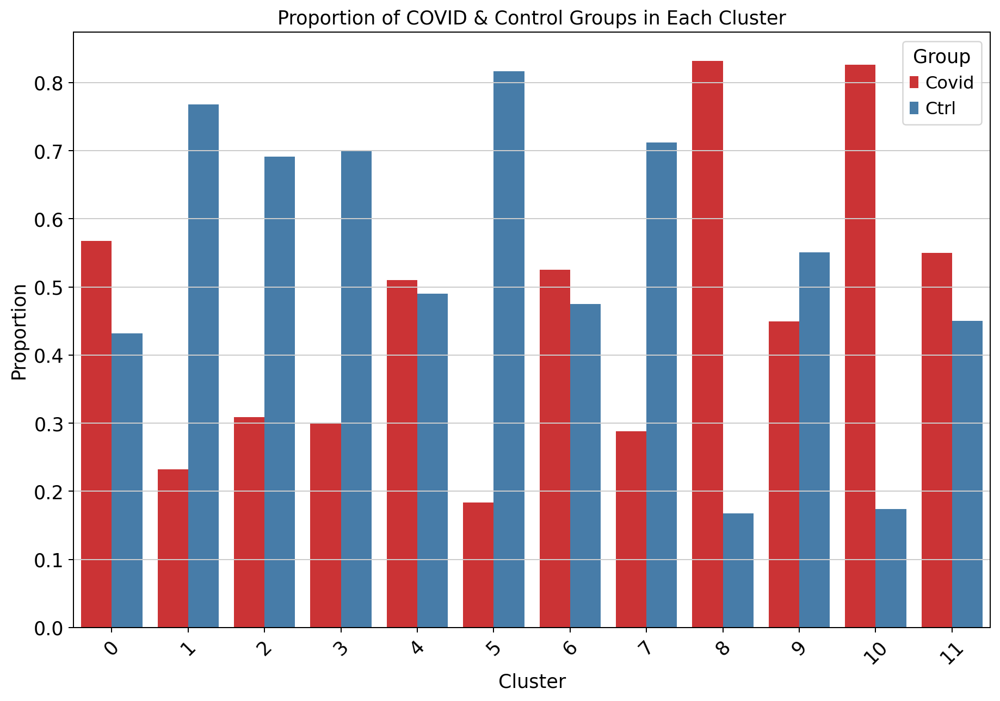

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


group_proportions = group_proportions.reset_index().melt(id_vars='cluster', var_name='group', value_name='proportion')

plt.figure(figsize=(12, 8))
sns.barplot(data=group_proportions, x='cluster', y='proportion', hue='group', palette='Set1')
plt.title('Proportion of COVID & Control Groups in Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Proportion')
plt.legend(title='Group')
plt.xticks(rotation=45)
plt.show()


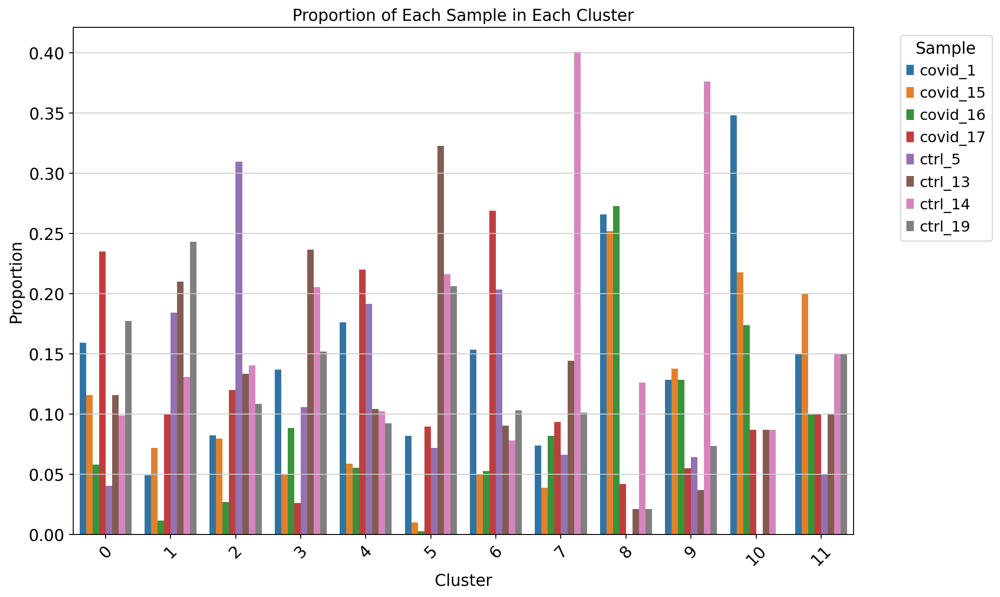

In [ ]:

sample_proportions = sample_proportions.reset_index().melt(id_vars='cluster', var_name='sample', value_name='proportion')

plt.figure(figsize=(12, 8))
sns.barplot(data=sample_proportions, x='cluster', y='proportion', hue='sample', palette='tab10')
plt.title('Proportion of Each Sample in Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Proportion')
plt.legend(title='Sample', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.show()


There is a good representation of each sample in given clusters. In a way we do not see a bias towards samples being present in only one cluster.  

**Task:**  
- Can you generate this plot in opposit direction? Showing the distribution of **clusters** in each **sample**. In other words, the colors show clusters while you have samples
on x-axis.  
- Plot some of the QC metrics for each cluster (e.g. by violin plot)

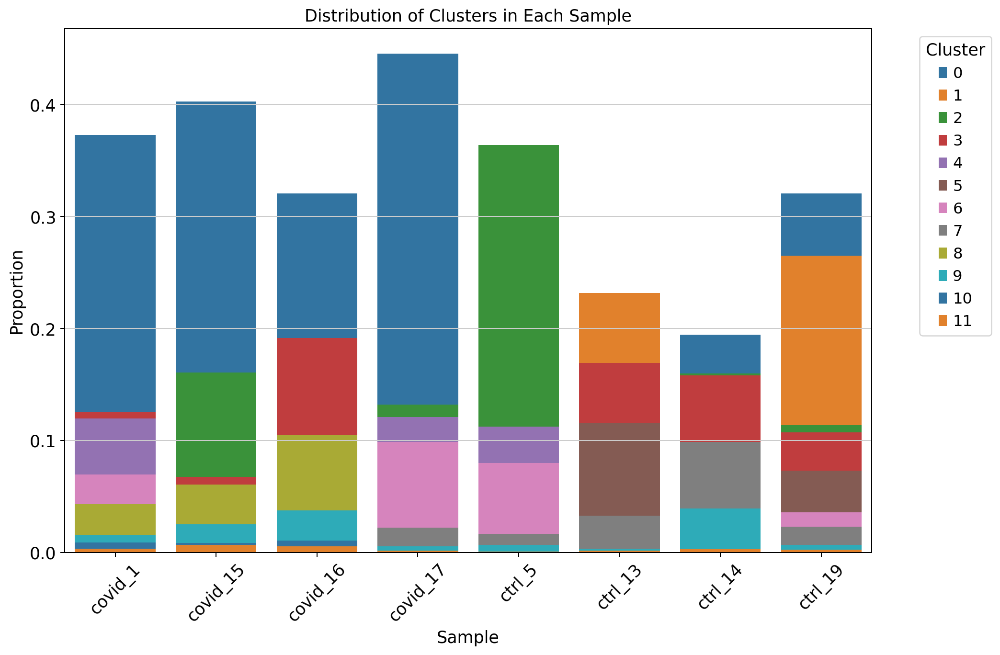

In [ ]:
# New and better approach than before ig...
cluster_col = 'leiden_0.6'
sample_col = 'sample'


clusters = adata.obs[cluster_col]
samples = adata.obs[sample_col]


proportions = pd.crosstab(index=samples, columns=clusters, normalize='index')

proportions = proportions.reset_index().melt(id_vars=sample_col, var_name='cluster', value_name='proportion')

plt.figure(figsize=(12, 8))
sns.barplot(data=proportions, x=sample_col, y='proportion', hue='cluster', palette='tab10', dodge=False)
plt.title('Distribution of Clusters in Each Sample')
plt.xlabel('Sample')
plt.ylabel('Proportion')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.show()


## Differential gene expression
Differential gene expression in scRNASeq data can be used to:  
- Identify gene markers to distinguish cell populations  
- Identify differentially regulated genes across conditions (healthy vs control)

There are parametric and non-parametric tests implemented in `rank_genes_group` (e.g. `logreg`, `t-test`, ` wilcoxon`).  

**NOTE:** By default, `.raw`  data in AnnData object used which can be controlled by `use_raw = False`.  



(7238, 19468)


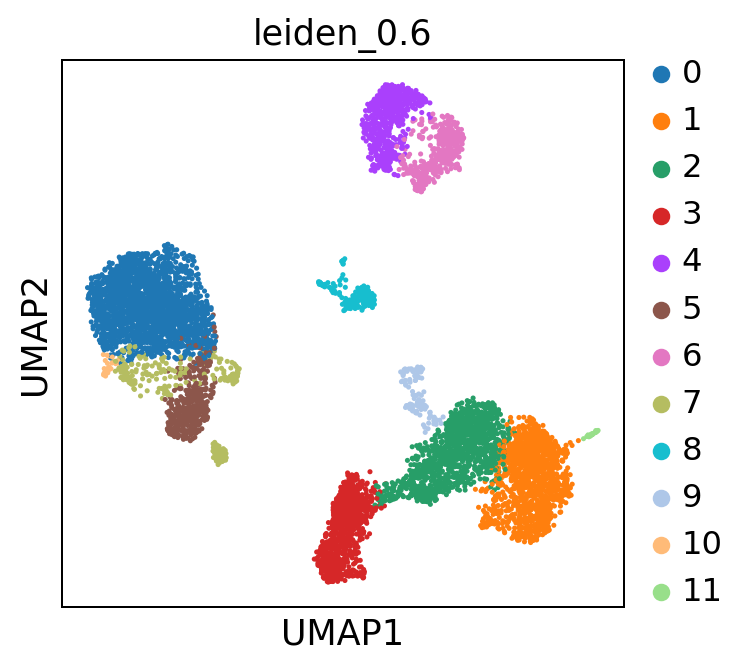

In [ ]:
adata = sc.read_h5ad(os.path.join(path_results, "covid_filtered_removed_doublets_dr_harmony_cl.h5ad"))

print(adata.X.shape)

sc.pl.umap(adata ,  color= 'leiden_0.6')

In the AnnData object we have all the genes after filtering (>19000 genes).

### T-test

ranking genes
    finished: added to `.uns['t-test']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


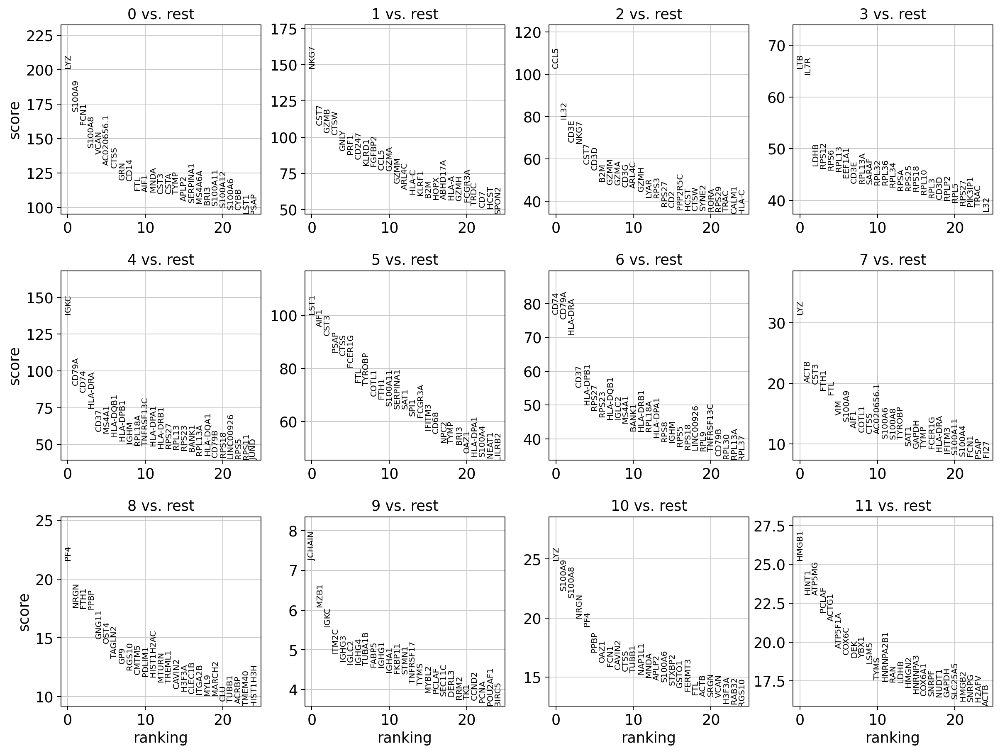

AnnData object with n_obs × n_vars = 7238 × 19468
    obs: 'type', 'sample', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_genes', 'percent_chrY', 'XIST-counts', 'doublet_scores', 'detected_doublets', 'doublet_info', 'n_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4', 'kmeans5', 'kmeans10', 'kmeans15', 'hclust_5', 'hclust_10', 'hclust_15'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'dendrogram_leiden_0.6', 'doublet_info_colors', 'hclust_10_colors', 'hclust_15_colors', 'hclust_5_colors', 'hvg', 'kmeans10_colors', 'kmeans15_colors', 'kmeans5_colors', 'leiden', 'leiden_0.4', 'lei

In [ ]:
sc.tl.rank_genes_groups(adata, 'leiden_0.6', method='t-test', key_added = "t-test")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "t-test")

# results are stored in the adata.uns["t-test"] slot
adata

You can also extract a table for top 10 DEGs. In this case it is DEGs for comparison between clsuter 1 and the rest.

In [ ]:
sc.get.rank_genes_groups_df(adata, group='1', key='t-test', pval_cutoff=0.01, log2fc_min=0)

,names,scores,logfoldchanges,pvals,pvals_adj
0,NKG7,147.420761,5.563618,0.000000,0.000000
1,CST7,108.274406,4.525131,0.000000,0.000000
2,GZMB,103.140656,5.533550,0.000000,0.000000
3,CTSW,101.750793,4.697517,0.000000,0.000000
4,GNLY,90.637741,6.312925,0.000000,0.000000
...,...,...,...,...,...
3353,LARP7,2.903995,0.253697,0.003734,0.009864
3354,ZNF677,2.903766,0.755769,0.003741,0.009880
3355,BBX,2.902428,0.239194,0.003751,0.009907
3356,DESI2,2.901202,0.406600,0.003769,0.009951


In [ ]:
sc.tl.rank_genes_groups(adata, 'leiden_0.6', method='t-test_overestim_var', key_added = "t-test_ov")

ranking genes
    finished: added to `.uns['t-test_ov']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


### Wilcoxon rank-sum

ranking genes
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:27)


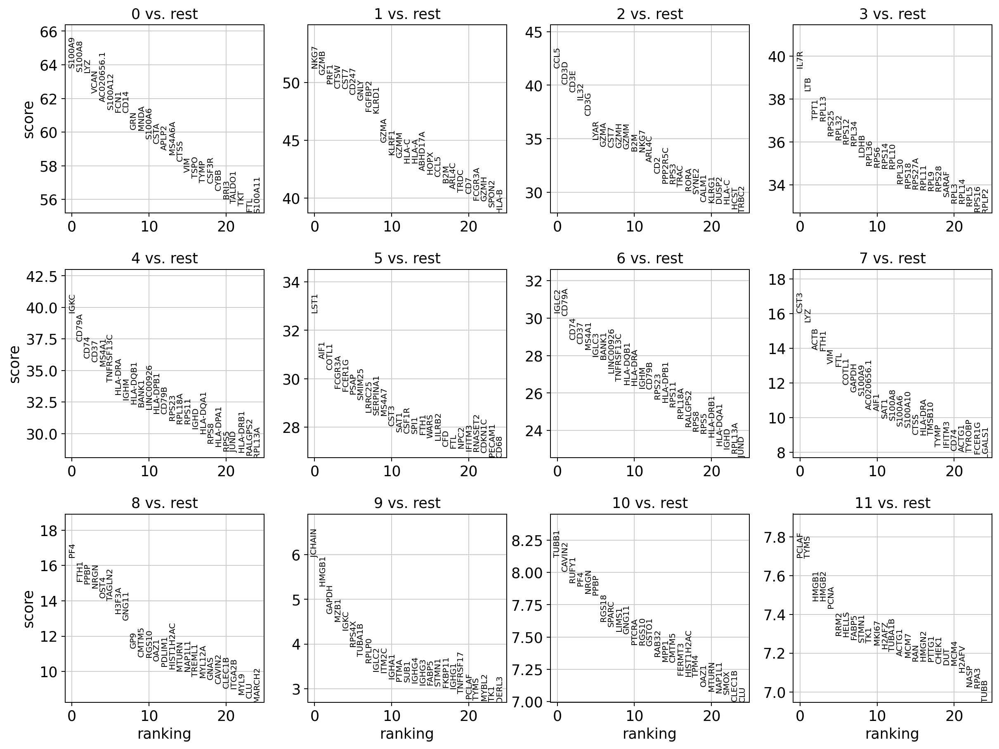

In [ ]:
sc.tl.rank_genes_groups(adata, 'leiden_0.6', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key="wilcoxon")

### Comparing the output of DEG analysis
Here we check the overlap of DEGs among different appraoches

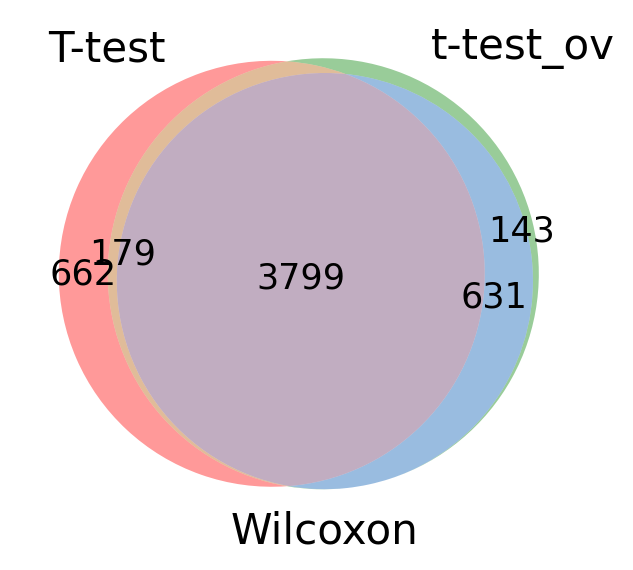

In [ ]:
#compare cluster1 genes, only stores top 100 by default

tt = sc.get.rank_genes_groups_df(adata, group='0', key='t-test', pval_cutoff=0.01, log2fc_min=0)['names']
tt_ov = sc.get.rank_genes_groups_df(adata, group='0', key='t-test_ov', pval_cutoff=0.01, log2fc_min=0)['names']
wc = sc.get.rank_genes_groups_df(adata, group='0', key='wilcoxon', pval_cutoff=0.01, log2fc_min=0)['names']

venn3([set(wc),set(tt),set(tt_ov)], ('T-test', 't-test_ov', 'Wilcoxon') )
plt.show()

### Visualisation  
We can show DEGs by different approaches.

For example here we select top 5 genes and visualise their expression per cluster.

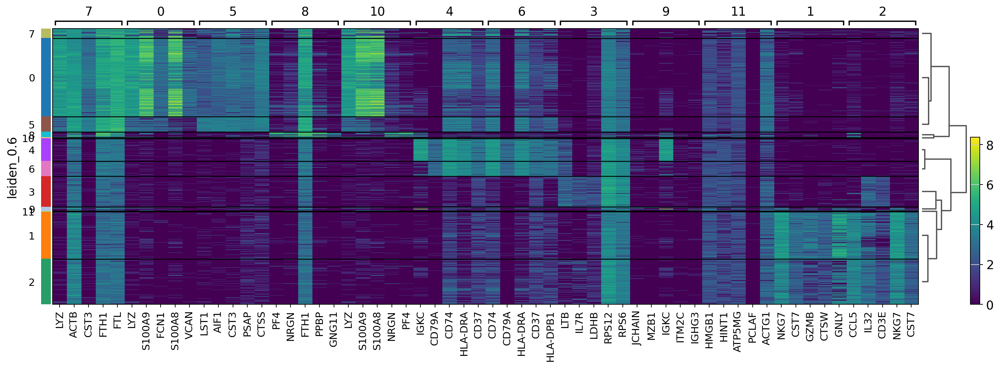

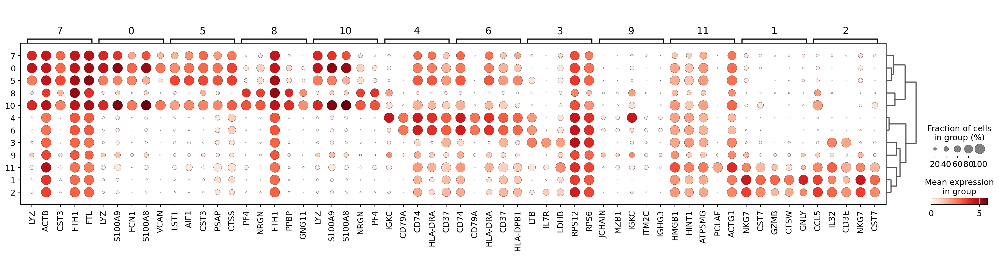

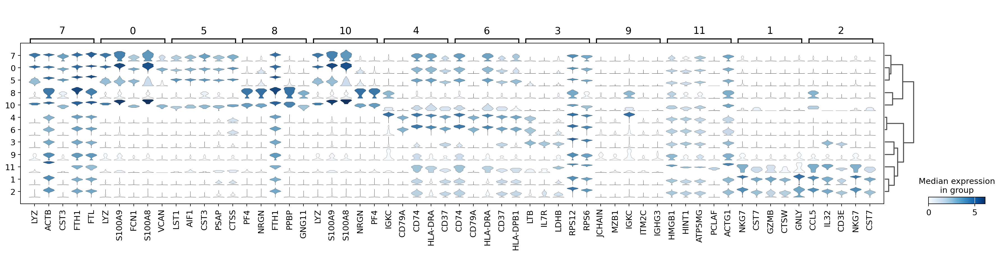

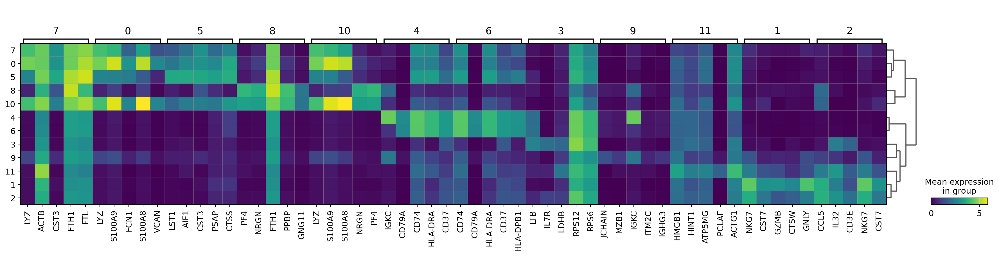

In [ ]:
# Heatmap
sc.pl.rank_genes_groups_heatmap(adata, n_genes=5, key="t-test", groupby="leiden_0.6", show_gene_labels=True)
# dotplot
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5, key="t-test", groupby="leiden_0.6")
# violin plot
sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=5, key="t-test", groupby="leiden_0.6")
# matrixplot
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, key="t-test", groupby="leiden_0.6")

### Coparison between conditions (Covid vs Control)
In addition to differential expression analysis among clusters, we can make a comparison between conditions within clusters. To do so, we need to subset our data for the desired cell cluster, then change the cell identities to the variable of comparison (e.g. Covid/Ctrl).

type
Covid    304
Ctrl     292
Name: count, dtype: int64
ranking genes
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


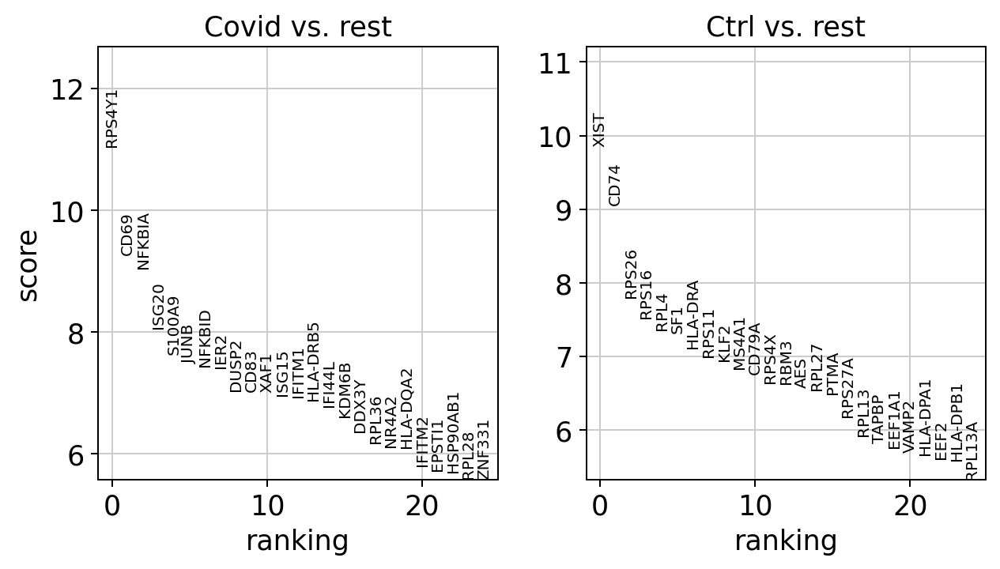

In [ ]:
cl1 = adata[adata.obs['leiden_0.6'] == '4',:]
print(cl1.obs['type'].value_counts())


sc.tl.rank_genes_groups(cl1, 'type', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(cl1, n_genes=25, sharey=False, key="wilcoxon")


We can also show the expression distribution of significant genes.

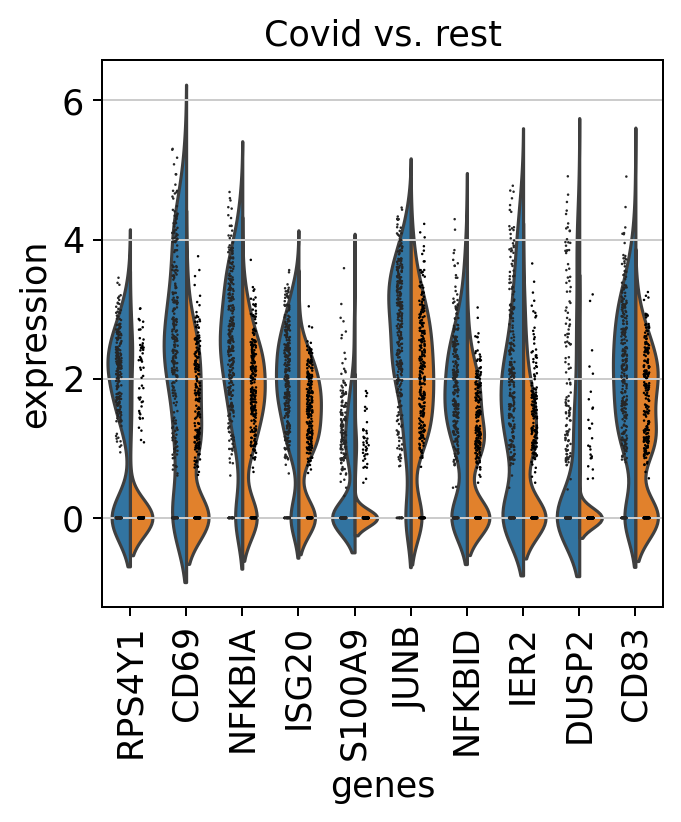

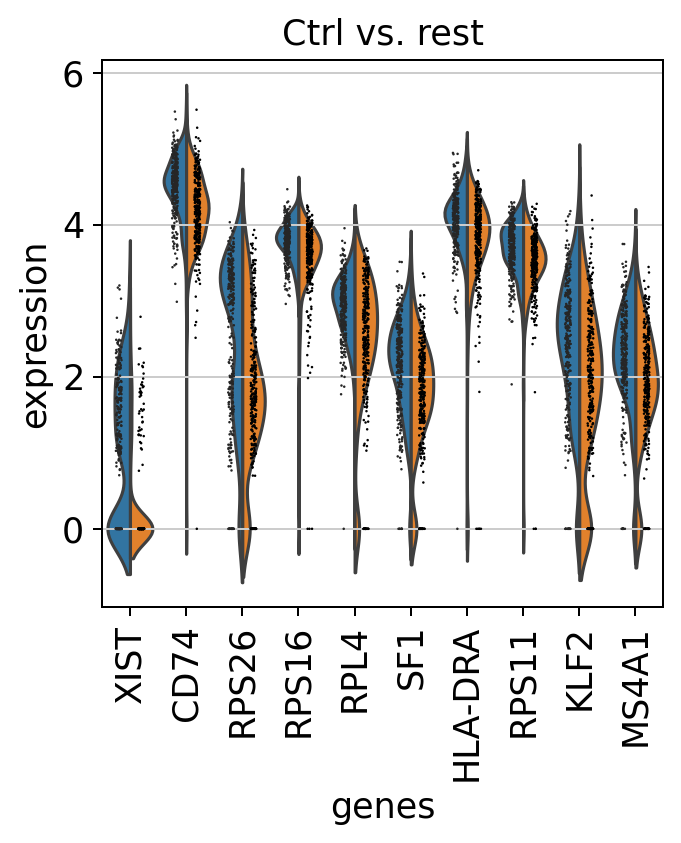

In [ ]:
sc.pl.rank_genes_groups_violin(cl1, n_genes=10, key="wilcoxon")

It is also possible to show the expression distribution of selected genes in each cluster for both conditions (Covid//Control)

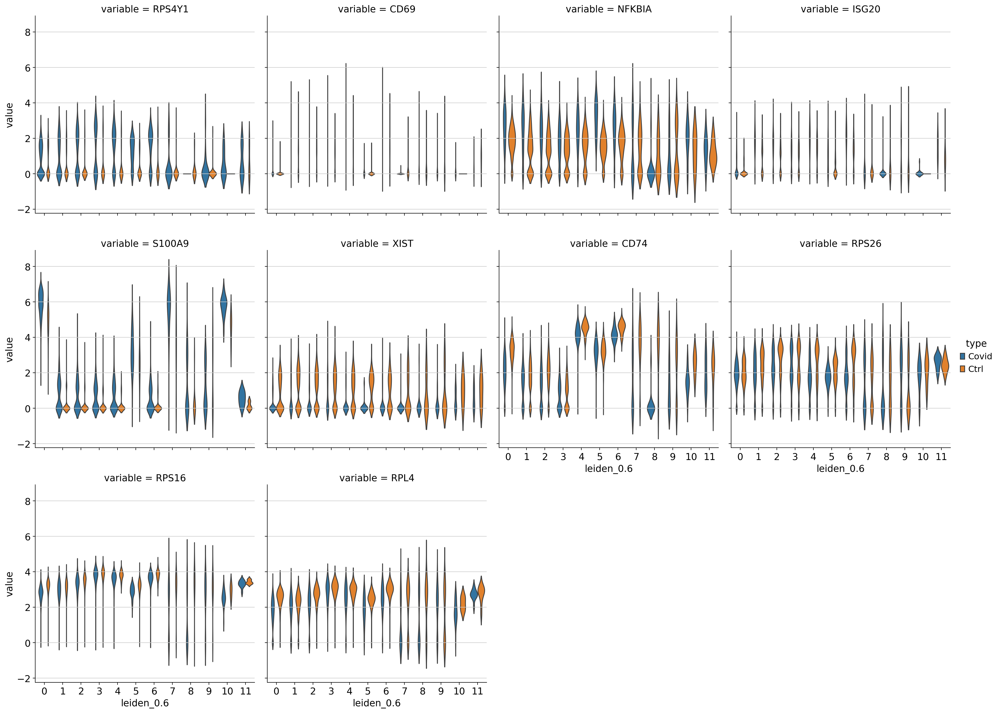

In [ ]:
genes1 = sc.get.rank_genes_groups_df(cl1, group='Covid', key='wilcoxon')['names'][:5]
genes2 = sc.get.rank_genes_groups_df(cl1, group='Ctrl', key='wilcoxon')['names'][:5]
genes = genes1.tolist() +  genes2.tolist()
df = sc.get.obs_df(adata, genes + ['leiden_0.6','type'], use_raw=False)
df2 = df.melt(id_vars=["leiden_0.6",'type'], value_vars=genes)

sns.catplot(x = "leiden_0.6", y = "value", hue = "type", kind = 'violin', col = "variable", data = df2, col_wrap=4, inner=None)

Some of the identified genes are located on sex chromosome, which is due to imbalanced sex ratio in the dataset and we can remove the genes from sex chromosome and redo the analysis.

550
19468
18918
ranking genes
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


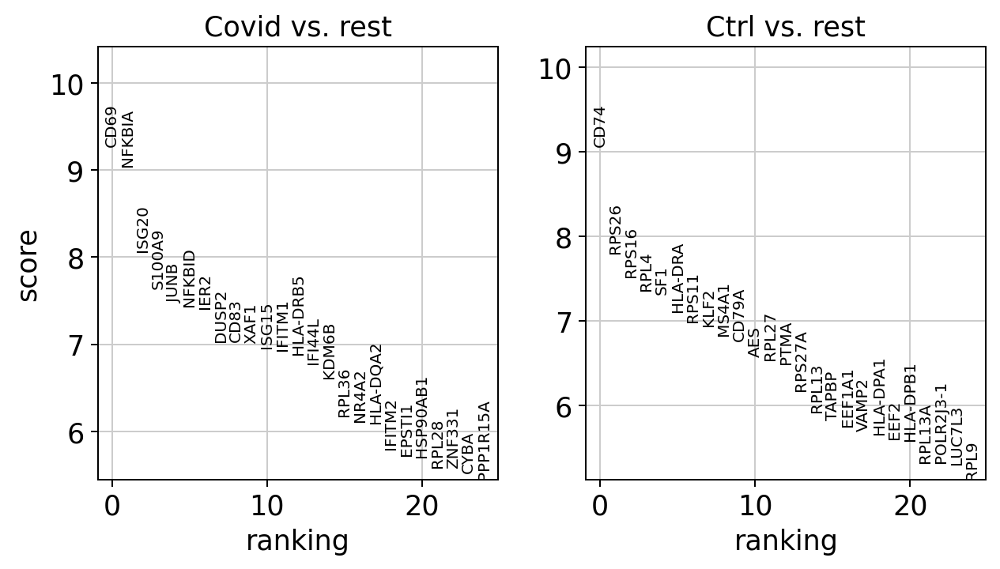

In [ ]:
# Removing sex chromosome genes
annot = sc.queries.biomart_annotations(
        "hsapiens",
        ["ensembl_gene_id", "external_gene_name", "start_position", "end_position", "chromosome_name"],
    ).set_index("external_gene_name")

chrY_genes = adata.var_names.intersection(annot.index[annot.chromosome_name == "Y"])
chrX_genes = adata.var_names.intersection(annot.index[annot.chromosome_name == "X"])

sex_genes = chrY_genes.union(chrX_genes)
print(len(sex_genes))
all_genes = cl1.var.index.tolist()
print(len(all_genes))

keep_genes = [x for x in all_genes if x not in sex_genes]
print(len(keep_genes))

cl1 = cl1[:,keep_genes]

# run the rank_genes_groups again
sc.tl.rank_genes_groups(cl1, 'type', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(cl1, n_genes=25, sharey=False, key="wilcoxon")

### Subsample
It is important that samples show consistent pattern of expression in significant genes. Let's look in our dataset how consistent is the expression profile of identified genes.

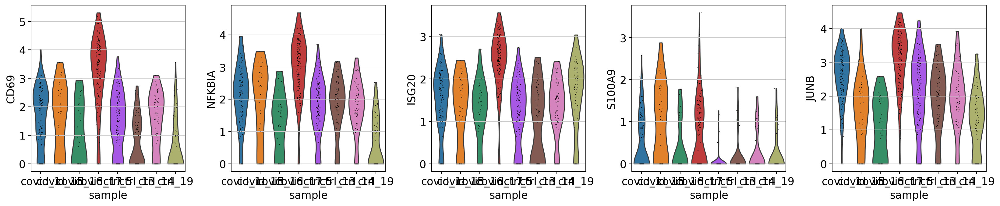

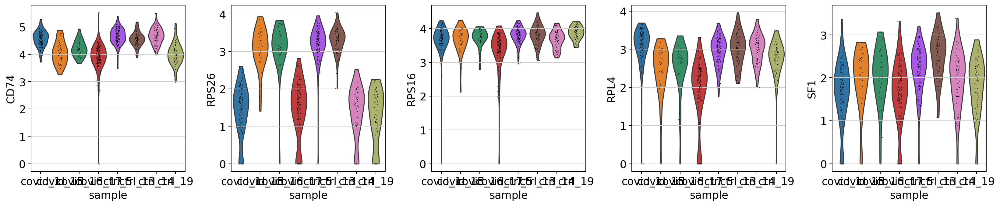

In [ ]:
genes1 = sc.get.rank_genes_groups_df(cl1, group='Covid', key='wilcoxon')['names'][:5]
genes2 = sc.get.rank_genes_groups_df(cl1, group='Ctrl', key='wilcoxon')['names'][:5]

sc.pl.violin(cl1, genes1, groupby='sample')
sc.pl.violin(cl1, genes2, groupby='sample')

We can also visualise as dotplot by which we can screen more genes (e.g. 20).

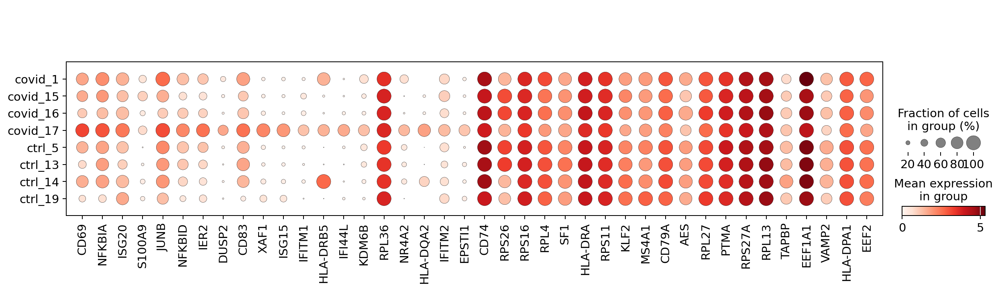

In [ ]:
genes1 = sc.get.rank_genes_groups_df(cl1, group='Covid', key='wilcoxon')['names'][:20]
genes2 = sc.get.rank_genes_groups_df(cl1, group='Ctrl', key='wilcoxon')['names'][:20]
genes = genes1.tolist() +  genes2.tolist()

sc.pl.dotplot(cl1, genes, groupby='sample')

As you can see, sample **Covid_17** has a distinct expression profile and has the highest number of cells which may drive the signal.

In [ ]:
cl1.obs['sample'].value_counts()

,count
sample,
covid_17,131
ctrl_5,114
covid_1,105
ctrl_13,62
ctrl_14,61
ctrl_19,55
covid_15,35
covid_16,33


In order to control for the bias, we subsample to have the same number of cells for comparison.

In [ ]:
target_cells = 37

# Split the data by 'sample'
tmp = [cl1[cl1.obs['sample'] == s].copy() for s in cl1.obs['sample'].cat.categories]

# Subsample each group if it has more than target_cells
for dat in tmp:
    if dat.n_obs > target_cells:
        sc.pp.subsample(dat, n_obs=target_cells)

# Concatenate the subsampled data
cl1_sub = tmp[0].concatenate(*tmp[1:], batch_key=None)

# Display value counts of the 'sample' column
cl1_sub.obs['sample'].value_counts()


,count
sample,
covid_1,37
covid_17,37
ctrl_5,37
ctrl_13,37
ctrl_14,37
ctrl_19,37
covid_15,35
covid_16,33


Now, we repeat the comparison and visualise DEGs.

ranking genes
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


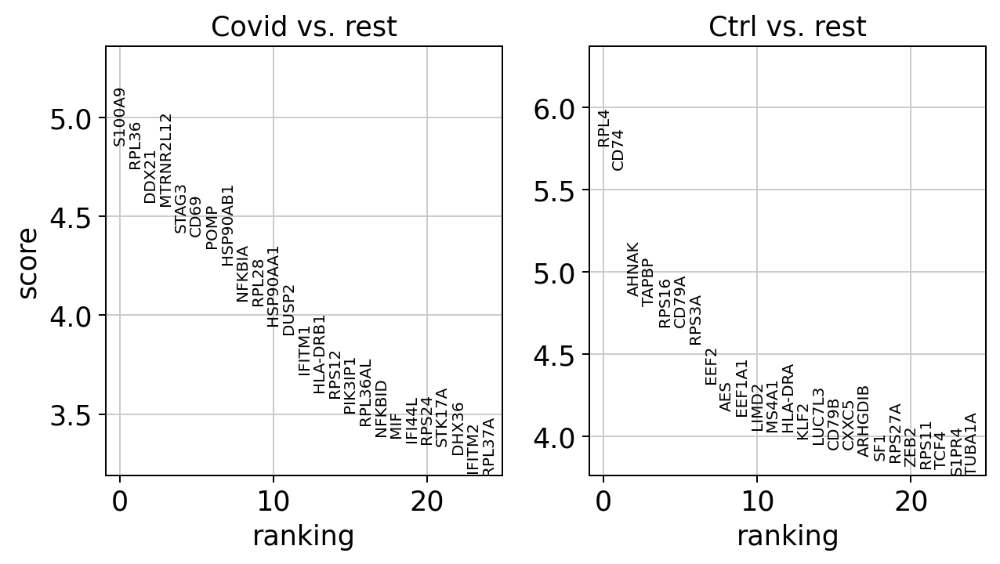

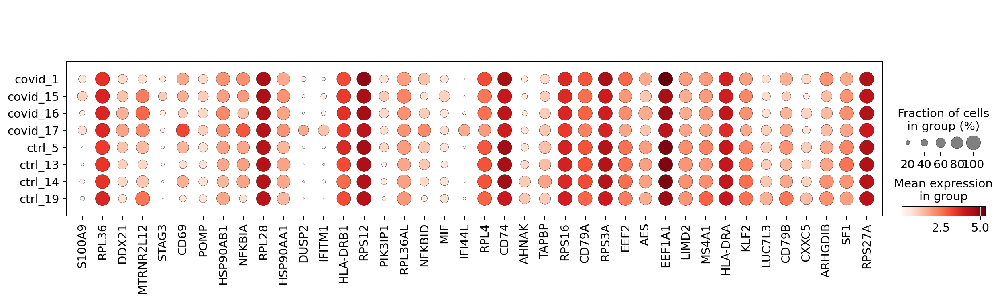

In [ ]:
sc.tl.rank_genes_groups(cl1_sub, 'type', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(cl1_sub, n_genes=25, sharey=False, key="wilcoxon")

genes1 = sc.get.rank_genes_groups_df(cl1_sub, group='Covid', key='wilcoxon')['names'][:20]
genes2 = sc.get.rank_genes_groups_df(cl1_sub, group='Ctrl', key='wilcoxon')['names'][:20]
genes = genes1.tolist() +  genes2.tolist()

sc.pl.dotplot(cl1,genes, groupby='sample')

The results are much improved now. However, when examining the data per patient, we still see some genes predominantly influenced by a single patient. It's generally a good practice to control for the number of cells from each sample when performing differential expression analysis.

There are several methods available to address patient batch effects, but many of them rely on R packages. These can be accessed through rpy2, as demonstrated in this compendium: https://www.sc-best-practices.org/conditions/differential_gene_expression.html.

**Bonus**  
You can also make comparison between two given clusters, in following case you are going to compare cluster `1`  and `2`.  

In [ ]:
adata_copy = adata.copy()
sc.tl.rank_genes_groups(
    adata = adata_copy,
    groupby = "leiden_0.6",
    groups=["1", "2"],
    method="wilcoxon",
    corr_method="benjamini-hochberg"
)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:24)


categories: 0, 1, 2, etc.
var_group_labels: 1, 2


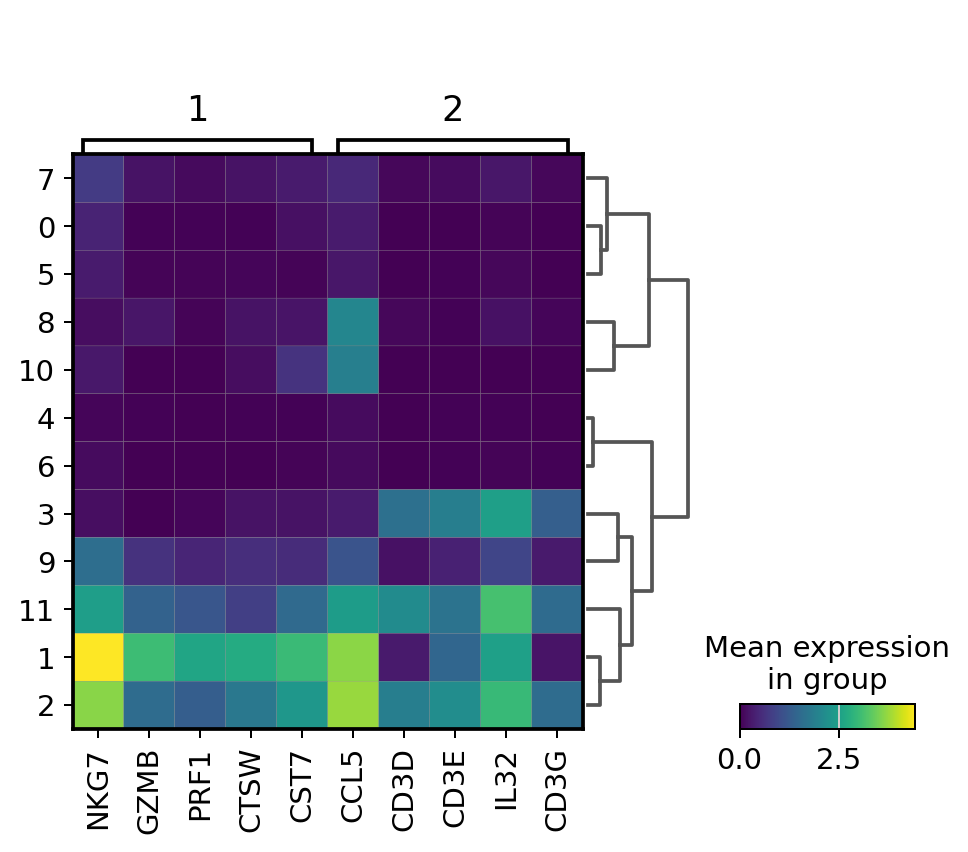

categories: 0, 1, 2, etc.
var_group_labels: 1, 2


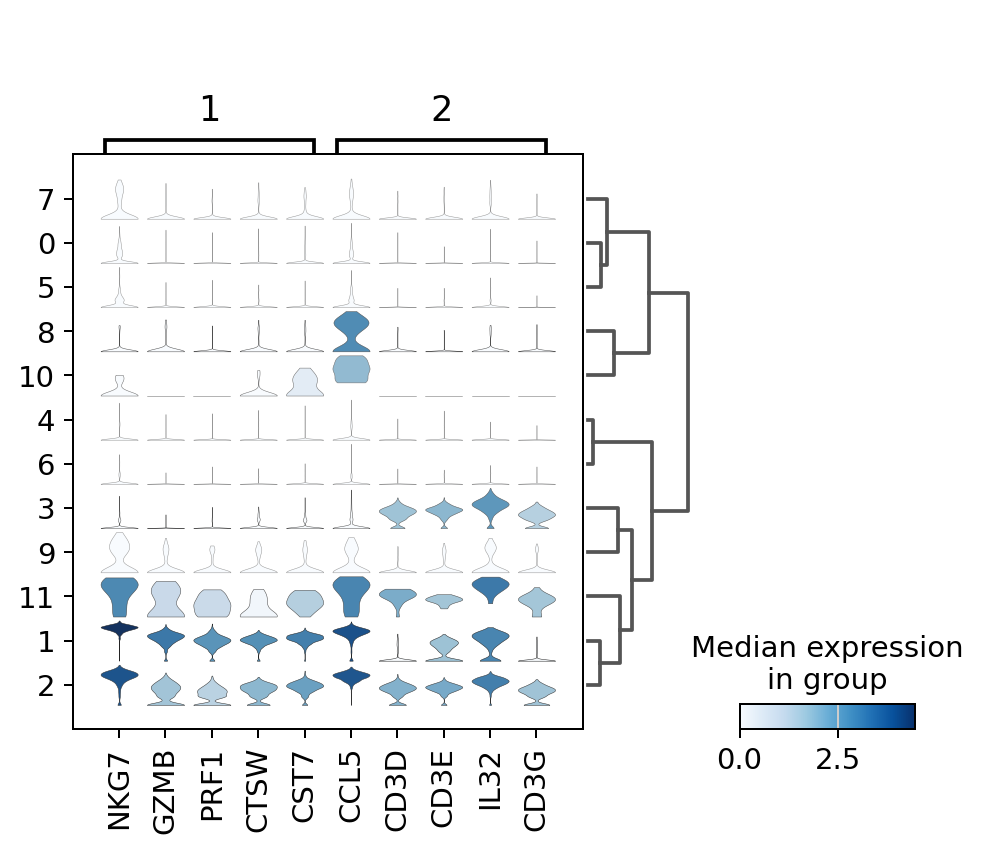

In [ ]:
sc.pl.rank_genes_groups_matrixplot(adata_copy, n_genes=5, key="rank_genes_groups", groupby="leiden_0.6")
sc.pl.rank_genes_groups_stacked_violin(adata_copy, n_genes=5, key="rank_genes_groups", groupby="leiden_0.6")

# **Advanced Task: Implementing a Variational Autoencoder (VAE) for scRNA-Seq Data**

In this final advanced task, we will implement a **Variational Autoencoder (VAE)** to explore deep-learning based dimensionality reduction and batch correction in scRNA-seq data, inspired by the [**scVI**](https://www.nature.com/articles/s41592-018-0229-2.epdf?author_access_token=5sMbnZl1iBFitATlpKkddtRgN0jAjWel9jnR3ZoTv0P1-tTjoP-mBfrGiMqpQx63aBtxToJssRfpqQ482otMbBw2GIGGeinWV4cULBLPg4L4DpCg92dEtoMaB1crCRDG7DgtNrM_1j17VfvHfoy1cQ%3D%3D) model. This method is more advanced than UMAP or PCA, as it allows for probabilistic modeling and takes into account technical variation, dropout events, and biological variability in the data.

## **Getting Started**

In this task, you will build and train a VAE to handle scRNA-seq data. The VAE consists of:

- **Encoder:** Compresses the scRNA-seq data into a latent space.
- **Decoder:** Reconstructs the scRNA-seq data from the latent space representation.

## **VAE Architecture**

![VAE Architecture](https://ddls.aicell.io/course/ddls-2024/module-3/scRNA-seq_VAE.png)


## **Familiarizing Yourself with VAEs**

To deepen your understanding of VAEs and their applications in scRNA-seq data analysis, follow the steps below. This exercise will help you grasp essential concepts and explore how VAEs can enhance your analysis tasks.

**Construct a Prompt for ChatGPT:**
- Create a detailed prompt to help you learn about VAEs. Your prompt should include questions about the following key concepts:
  - **VAEs in General:** What are Variational Autoencoders, and how do they work?
  - **Gaussian Distributions:** How does the Gaussian distribution relate to the VAE latent space?
  - **Reparametrization Trick:** What is the reparametrization trick, and why is it important in VAEs?
  - **ZINB Distribution:** Why is the Zero-Inflated Negative Binomial (ZINB) distribution used in scRNA-seq data, and how does it help in modeling the data?
  - **Batch Effect Correction:** How does scVI use one-hot-encoded batch factors to correct for batch effects?
- Ask ChatGPT to brainstorm how these concepts can be applied to your tasks in the scRNA-seq data analysis workflow.

By completing this task, you will gain a solid understanding of VAEs and their practical applications in scRNA-seq analysis, enhancing your ability to tackle complex data challenges.

(If you are confident enough about this, feel free to skip this step)


```
#⭐ Double click to upload your chat history here
#link: https://...
```


## **Task Instructions**

### **1. Prepare the Colab Environment**
To ensure your notebook runs efficiently, you will need to:
- Change the runtime to GPU (for faster training):
   - Go to **Runtime** -> **Change runtime type** -> **Hardware accelerator** -> **GPU**.
   - **Note:** This will reset all your previously installed packages!
   - If a GPU runtime is currently unavailable for your Google account, you can explore the implementation of the VAE even with CPU.
- Install PyTorch:
  ```bash
  !pip install torch
  ```
- Install anndata:
  ```bash
  !pip install anndata
  ```
- Load the filtered annotated data:
  ```python
  import anndata

  # Adjust the path if necessary
  filtered_data_path = "/content/data/covid/results/covid_filtered.h5ad"
  adata = anndata.read_h5ad(filtered_data_path)
  ```

### **2. Implementing the VAE**

You will implement a simplified VAE for scRNA-seq data. Here’s a summary of the architecture and output parameters:

#### **Encoder**

- **Input:** Raw scRNA-seq counts plus one-hot encoded batch factors (concatenation along feature dimension).
  - **Input dimensions:** $n_{\text{genes}} + n_{\text{batches}}$
  - **Example one-hot encoding for 8 samples:** If there are 8 samples, a one-hot encoded vector for each sample will be of length 8, where only one element is 1 and the rest are 0.

- **Hidden Layers:** Two consecutive blocks of fully connected layers, each followed by layer normalization and ReLU activation.
  - **Hidden dimensions:** $n_{\text{hidden}} = 2048$

- **Output (Latent Space):** Parameters for the Gaussian distribution.
  - **Latent dimensions:** $n_{\text{latent}} = 64$
  - **Mean:** $\mu \in [-\infty, +\infty]$ (no activation)
  - **Log of standard deviation:** $\log(\sigma) \in [-\infty, +\infty]$ (no activation)

#### **Decoder**

- **Input:** Sampled latent representation (z) plus one-hot encoded batch factors (concatenation along feature dimension).
  - **Input dimensions:** $n_{\text{latent}} + n_{\text{batches}}$

- **Hidden Layers:** Three consecutive blocks of fully connected layers, each followed by layer normalization and ReLU activation.
  - **Hidden dimensions:** $n_{\text{hidden}} = 2048$

- **Output (Reconstruction):** Parameters for the ZINB distribution. The scale is used to calculate the mean of the Negative Binomial distribution in the ZINB loss.
  - **Output dimensions:** $n_{\text{genes}}$
  - **Scale:** $\in [0, 1]$ (Softmax activation)
  - **Log of inverse dispersion:** $\log(\theta) \in [-\infty, +\infty]$ (no activation)
  - **Logit of dropout rate:** $\pi \in [-\infty, +\infty]$ (no activation)

### **3. Loss Functions**

The total loss of the VAE is the sum of:
- **ZINB Loss** (reconstruction)
- **KL Divergence** (ensures the latent space is close to a Gaussian distribution)

#### **ZINB Loss**

The **Zero-Inflated Negative Binomial (ZINB) loss** is used in VAEs for modeling sparse and overdispersed scRNA-seq data. It combines two components: a **Negative Binomial (NB) distribution**, which handles the overdispersed counts, and a **zero-inflation** probability, which accounts for the excess zeros in the data. The VAE decoder predicts parameters for both the NB distribution (mean and dispersion) and the zero-inflation process (dropout rate). The ZINB loss measures the likelihood of observing raw count data, accounting for both the biological or technical zeros and overdispersed gene counts.

```python
import torch
import torch.nn as nn
import torch.nn.functional as F

class ZINB_Loss(nn.Module):
    def __init__(self, eps=1e-08):
        super(ZINB_Loss, self).__init__()
        self.eps = eps

    def forward(self, input_x, scale, log_theta, pi):
        lib_size = torch.sum(input_x, dim=-1)  # Sum of counts per cell
        mu = scale * lib_size[..., None]  # Scale input for reconstruction

        log_theta = torch.clamp(log_theta, min=-2000000, max=15)
        theta = torch.exp(log_theta)

        softplus_pi = F.softplus(-pi)
        log_theta_mu_eps = torch.log(theta + mu + self.eps)
        pi_theta_log = -pi + theta * (torch.log(theta + self.eps) - log_theta_mu_eps)

        # Zero-inflation component
        case_zero = F.softplus(pi_theta_log) - softplus_pi
        mul_case_zero = torch.mul((input_x < self.eps).type(torch.float32), case_zero)

        # Negative Binomial component for non-zero counts
        case_non_zero = (
            -softplus_pi
            + pi_theta_log
            + input_x * (torch.log(mu + self.eps) - log_theta_mu_eps)
            + torch.lgamma(input_x + theta)
            - torch.lgamma(theta)
            - torch.lgamma(input_x + 1)
        )
        mul_case_non_zero = torch.mul((input_x > self.eps).type(torch.float32), case_non_zero)

        zinb_loss = mul_case_zero + mul_case_non_zero

        return -zinb_loss.sum(-1)  # Sum over all features
```

#### **KL Divergence**

**KL-Divergence** in a VAE acts as a regularization term that encourages the learned latent space distribution ($q(z|x)$) to resemble a prior distribution, typically a standard Gaussian ($N(0, I)$). By minimizing the KL-Divergence, the model ensures that the latent space is smooth, preventing overfitting while maintaining meaningful data representations. This enables effective sampling from the latent space for generating new data while balancing reconstruction accuracy and latent space regularization.

```python
class KL_Divergence(nn.Module):
    def __init__(self):
        super(KL_Divergence, self).__init__()

    def forward(self, mu, log_var):
        kl_div = -0.5 * torch.sum(1.0 + log_var - mu.pow(2) - log_var.exp(), dim=-1)
        return kl_div
```

## **4. Exploring the VAE**

- Implement the VAE architecture using the provided encoder, decoder, and loss functions.
- Experiment with different parameters and training strategies to see how well your model performs.
- Aim to minimize the **ZINB loss** (reconstruction) and **KL divergence** to achieve accurate dimensionality reduction and gene expression reconstruction.
- Visualize the latent space using **UMAP** after training the VAE to observe how different cell types are distributed.

This task is open-ended—feel free to explore and experiment with the VAE architecture and its applications as you like!

Please provide your chat history if you used ChatGPT to implement the VAE.

```
# ⭐ Double click to upload your chat history here
# link: https://...
```

In [ ]:
!pip install torch
!pip install anndata
#

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.0/129.0 kB 5.5 MB/s eta 0:00:00


In [ ]:
import anndata

# Adjust the path if necessary
filtered_data_path = "/content/data/covid/results/covid_filtered.h5ad"
adata = anndata.read_h5ad(filtered_data_path)

FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = '/content/data/covid/results/covid_filtered.h5ad', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)